In [1]:
import os
from glob import glob
import numpy as np
import dask
import xarray as xr
import xrft
import cartopy.crs as ccrs
from cmocean import cm

from matplotlib import pyplot as plt
%matplotlib inline

from mitequinox.utils import *

/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/site-packages/cmocean/tools.py:76: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if not mpl.cbook.is_string_like(rgbin[0]):


In [2]:
from dask_jobqueue import PBSCluster
local_dir = os.getenv('TMPDIR')
cluster = PBSCluster(local_directory=local_dir)
#print(cluster.job_script())
w = cluster.start_workers(35)

/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/site-packages/distributed/utils.py:128: RuntimeWarning: Couldn't detect a suitable IP address for reaching '8.8.8.8', defaulting to '127.0.0.1': [Errno 101] Network is unreachable
  % (host, default, e), RuntimeWarning)


In [3]:
# get dask handles and check dask server status
from dask.distributed import Client
client = Client(cluster)

In [4]:
client

Client Scheduler: tcp://10.148.1.12:39771 Dashboard: http://10.148.1.12:8787/status,Cluster Workers: 70 Cores: 280 Memory: 3500.00 GB


---

# All faces

## compute and store spectra for all faces

In [5]:
### Here we need to load both SSU and SSV to generate the complex format of horizontal velocoty for rotary spectral calculations, u+iv

v_u = 'SSU'
v_v = 'SSV'

## open files, nc files (SSU,SSV) ##
ncdata_dir = '/home1/scratch/xyu/mit_nc_new/'

## dir where spectra will be stored
E_dir = '/home1/scratch/xyu/mit_spec/zavg_UV/'

## dir where spectra are stored for longer time than data_scratch
S_dir = '/home1/datawork/xyu/mit_zavg_spec/zavg_UV/'

print(ncdata_dir)
print(E_dir)
print(S_dir)

# number of fies to load for each face (1 file = 60 days, now )
Nf = 2

# grid file
mgrid = xr.open_dataset('/home1/scratch/xyu/mit_grid_t.nc')
mgrid = mgrid.drop(['XG','YG','i_g','j_g','k','k_u','k_l','k_p1'])




/home1/scratch/xyu/mit_nc_new/
/home1/scratch/xyu/mit_spec/zavg_UV/
/home1/datawork/xyu/mit_zavg_spec/zavg_UV/


_______

# 1. load and plot zonally averaged spectra


In [11]:
#filenames = sorted(glob(S_dir+'E_rotary_zavg_f*.nc'))
#filenames = sorted(glob(S_dir+'E_rotary_zavg_openocean_500m_f*.nc'))
#filenames = sorted(glob(S_dir+'E_rotary_zavg_coastalocean_500m_f*.nc'))
filenames = sorted(glob(S_dir+'E_rotary_zavg_openocean_200m_f*.nc'))
#filenames = sorted(glob(S_dir+'E_rotary_zavg_coastalocean_200m_f*.nc'))

%time ds = xr.open_mfdataset(filenames, concat_dim='face', compat='equals')
print(ds)

CPU times: user 60 ms, sys: 24 ms, total: 84 ms
Wall time: 109 ms
<xarray.Dataset>
Dimensions:    (face: 13, freq_time: 1439, lat: 120)
Coordinates:
  * lat        (lat) float64 -59.5 -58.5 -57.5 -56.5 -55.5 -54.5 -53.5 -52.5 ...
  * freq_time  (freq_time) float64 -0.0001388 -0.0001386 -0.0001384 ...
Dimensions without coordinates: face
Data variables:
    E          (face, lat, freq_time) float64 dask.array<shape=(13, 120, 1439), chunksize=(1, 120, 1439)>
    A          (face, lat) float64 dask.array<shape=(13, 120), chunksize=(1, 120)>


In [24]:
E = (ds.E*ds.A).sum(dim='face') / ds.A.sum(dim='face')
E = E.assign_coords(freq_cpd=E.freq_time * 86400.) 

print(E)

<xarray.DataArray (lat: 120, freq_time: 1439)>
dask.array<shape=(120, 1439), dtype=float64, chunksize=(120, 1439)>
Coordinates:
  * lat        (lat) float64 -59.5 -58.5 -57.5 -56.5 -55.5 -54.5 -53.5 -52.5 ...
  * freq_time  (freq_time) float64 -0.0001388 -0.0001386 -0.0001384 ...
    freq_cpd   (freq_time) float64 -11.99 -11.98 -11.96 -11.94 -11.93 -11.91 ...


### 1.1    full colorscale [-1, 4]

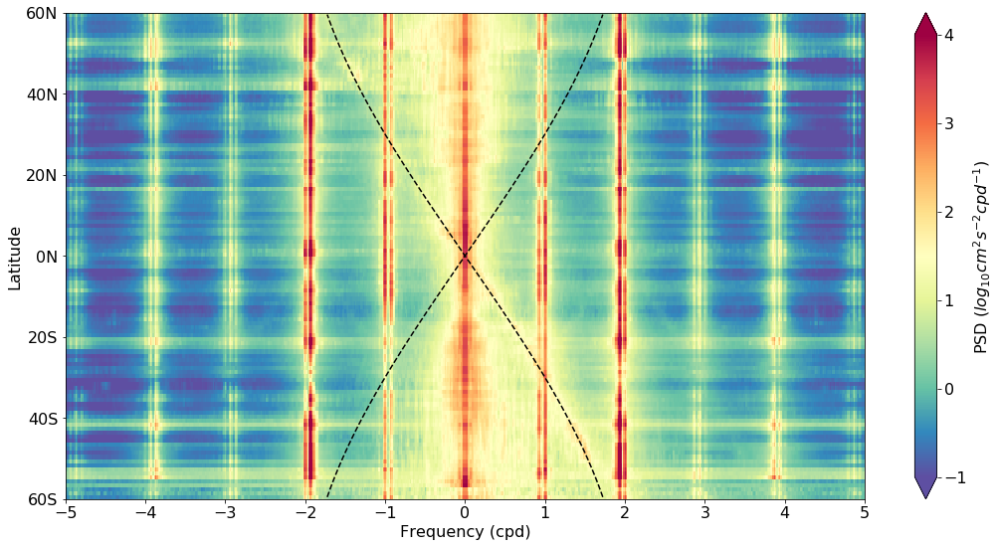

In [18]:

plt.figure(figsize=(18,9))
ax = plt.subplot(1,1,1)

E = E.assign_coords(freq_cpd=E.freq_time * 86400.) 
cax = np.log10(E/8.64).plot.pcolormesh(ax=ax, vmin=-1., vmax=4., x='freq_cpd', y='lat', cmap = 'Spectral_r', add_colorbar = False)

# colorbar
cbar = plt.colorbar(cax, ax=ax, extend='both', orientation='vertical')
cbar.ax.tick_params(labelsize=16)
cbar.set_label('PSD ($log_{10} cm^2 s^{-2} cpd^{-1})$', fontsize=16)
            

# x,y ticks

ax.set_xticks(list(ax.get_xticks()) + [-4., -3., -2., -1., 1., 2., 3., 4.])
ax.set_xlim(-5., 5.)
ax.set_ylim(-60., 60.)
ax.set_yticks([-60., -40., -20., 0., 20., 40., 60.])
ax.set_yticklabels(['60S','40S','20S','0N','20N','40N','60N'])

ax.set_ylabel('Latitude',fontsize=16)
ax.set_xlabel('Frequency (cpd)',fontsize=16)
ax.tick_params(labelsize=16)


# add coriolis frequency
f = 2.*2.*np.pi/86400. * np.sin(np.deg2rad(E.lat))
ax.plot(f*86400./2./np.pi,f.lat,'k--')
ax.plot(-f*86400./2./np.pi,f.lat,'k--')

#plt.savefig('/home1/datahome/xyu/equinox_working/sandbox/Figures/Rotary_spectra_uv_face0-12_openocean.png')
#plt.savefig('/home1/datahome/xyu/equinox_working/sandbox/Figures/Rotary_spectra_uv_face0-12_coastalocean.png')





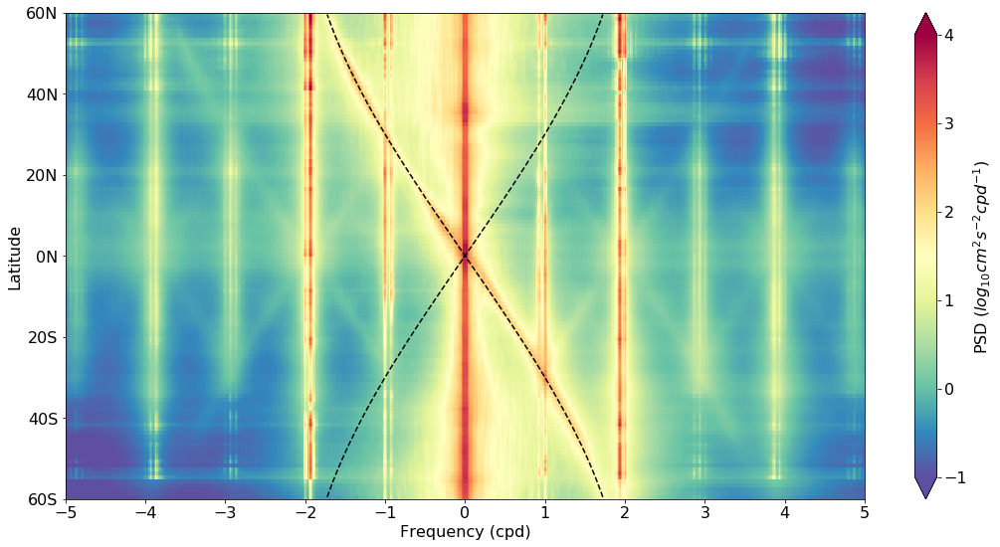

In [9]:
# Figure #

plt.figure(figsize=(18,9))
ax = plt.subplot(1,1,1)

E = E.assign_coords(freq_cpd=E.freq_time * 86400.) 
cax = np.log10(E/8.64).plot.pcolormesh(ax=ax, vmin=-1., vmax=4., x='freq_cpd', y='lat', cmap = 'Spectral_r', add_colorbar = False)

# colorbar
cbar = plt.colorbar(cax, ax=ax, extend='both', orientation='vertical')
cbar.ax.tick_params(labelsize=16)
cbar.set_label('PSD ($log_{10} cm^2 s^{-2} cpd^{-1})$', fontsize=16)
            

# x,y ticks

ax.set_xticks(list(ax.get_xticks()) + [-4., -3., -2., -1., 1., 2., 3., 4.])
ax.set_xlim(-5., 5.)
ax.set_ylim(-60., 60.)
ax.set_yticks([-60., -40., -20., 0., 20., 40., 60.])
ax.set_yticklabels(['60S','40S','20S','0N','20N','40N','60N'])

ax.set_ylabel('Latitude',fontsize=16)
ax.set_xlabel('Frequency (cpd)',fontsize=16)
ax.tick_params(labelsize=16)


# add coriolis frequency
f = 2.*2.*np.pi/86400. * np.sin(np.deg2rad(E.lat))
ax.plot(f*86400./2./np.pi,f.lat,'k--')
ax.plot(-f*86400./2./np.pi,f.lat,'k--')

plt.savefig('/home1/datahome/xyu/equinox_working/sandbox/Figures/Rotary_spectra_uv_face0-12_full.png')



### 1.2 using Shane's colorscale [0.5, 4]

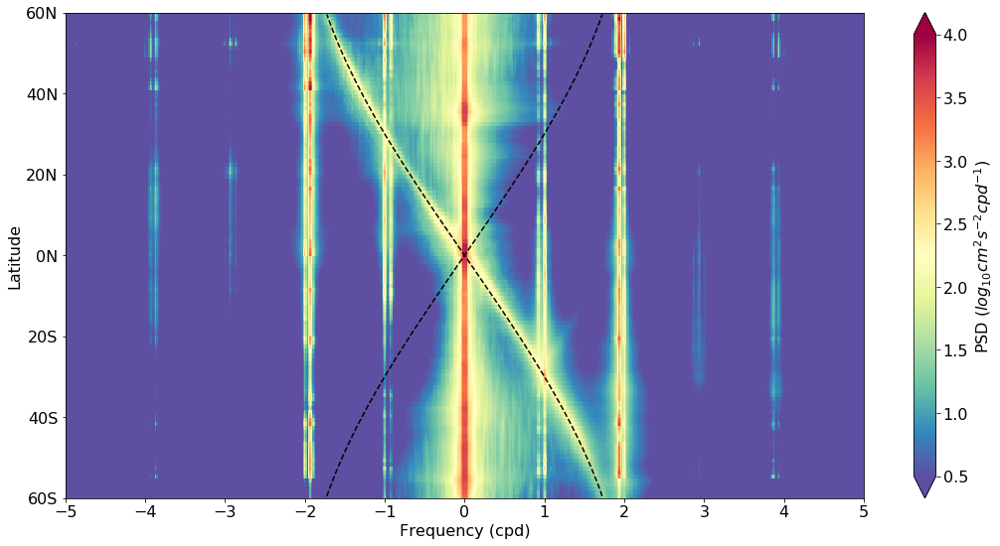

In [9]:
# Figure #

plt.figure(figsize=(18,9))
ax = plt.subplot(1,1,1)

E = E.assign_coords(freq_cpd=E.freq_time * 86400.) 
cax = np.log10(E/8.64).plot.pcolormesh(ax=ax, vmin=0.5, vmax=4., x='freq_cpd', y='lat', cmap = 'Spectral_r', add_colorbar = False)

# colorbar
cbar = plt.colorbar(cax, ax=ax, extend='both', orientation='vertical')
cbar.ax.tick_params(labelsize=16)
cbar.set_label('PSD ($log_{10} cm^2 s^{-2} cpd^{-1})$', fontsize=16)
            

# x,y ticks

ax.set_xticks(list(ax.get_xticks()) + [-4., -3., -2., -1., 1., 2., 3., 4.])
ax.set_xlim(-5., 5.)
ax.set_ylim(-60., 60.)
ax.set_yticks([-60., -40., -20., 0., 20., 40., 60.])
ax.set_yticklabels(['60S','40S','20S','0N','20N','40N','60N'])

ax.set_ylabel('Latitude',fontsize=16)
ax.set_xlabel('Frequency (cpd)',fontsize=16)
ax.tick_params(labelsize=16)


# add coriolis frequency
f = 2.*2.*np.pi/86400. * np.sin(np.deg2rad(E.lat))
ax.plot(f*86400./2./np.pi,f.lat,'k--')
ax.plot(-f*86400./2./np.pi,f.lat,'k--')

plt.savefig('/home1/datahome/xyu/equinox_working/sandbox/Figures/Rotary_spectra_uv_face0-12.png')


### 1.3 full frequency range

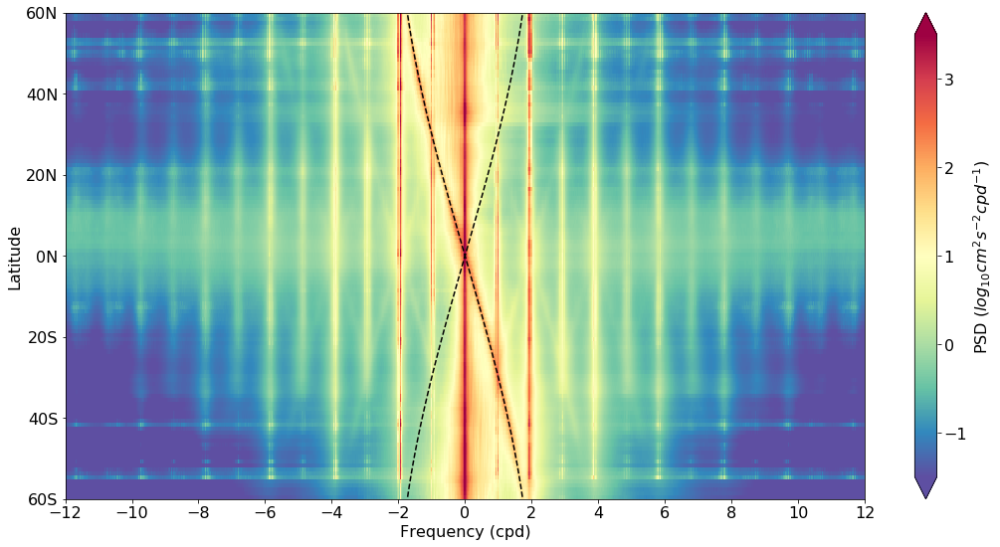

In [21]:
# Figure #

plt.figure(figsize=(18,9))
ax = plt.subplot(1,1,1)

E = E.assign_coords(freq_cpd=E.freq_time * 86400.) 
cax = np.log10(E/8.64).plot.pcolormesh(ax=ax, vmin=-1.5, vmax=3.5, x='freq_cpd', y='lat', cmap = 'Spectral_r', add_colorbar = False)

# colorbar
cbar = plt.colorbar(cax, ax=ax, extend='both', orientation='vertical')
cbar.ax.tick_params(labelsize=16)
cbar.set_label('PSD ($log_{10} cm^2 s^{-2} cpd^{-1})$', fontsize=16)
            

# x,y ticks

ax.set_xticks([-12., -10., -8., -6., -4., -2., 0., 2., 4., 6., 8., 10., 12.])
ax.set_xlim(-12., 12.)
ax.set_ylim(-60., 60.)
ax.set_yticks([-60., -40., -20., 0., 20., 40., 60.])
ax.set_yticklabels(['60S','40S','20S','0N','20N','40N','60N'])

ax.set_ylabel('Latitude',fontsize=16)
ax.set_xlabel('Frequency (cpd)',fontsize=16)
ax.tick_params(labelsize=16)


# add coriolis frequency
f = 2.*2.*np.pi/86400. * np.sin(np.deg2rad(E.lat))
ax.plot(f*86400./2./np.pi,f.lat,'k--')
ax.plot(-f*86400./2./np.pi,f.lat,'k--')

plt.savefig('/home1/datahome/xyu/equinox_working/sandbox/Figures/Rotary_spectra_uv.png')




# 2. Band-frequency integral

In [25]:
E = E.assign_coords(freq_cpd=E.freq_time * 86400.) 
print(E)

<xarray.DataArray (lat: 120, freq_time: 1439)>
dask.array<shape=(120, 1439), dtype=float64, chunksize=(120, 1439)>
Coordinates:
  * lat        (lat) float64 -59.5 -58.5 -57.5 -56.5 -55.5 -54.5 -53.5 -52.5 ...
  * freq_time  (freq_time) float64 -0.0001388 -0.0001386 -0.0001384 ...
    freq_cpd   (freq_time) float64 -11.99 -11.98 -11.96 -11.94 -11.93 -11.91 ...


In [26]:
df=E.freq_time[1]-E.freq_time[0]
print(df)

<xarray.DataArray 'freq_time' ()>
array(1.929012e-07)


## 2.1 Total energy vs tidal frequencies 

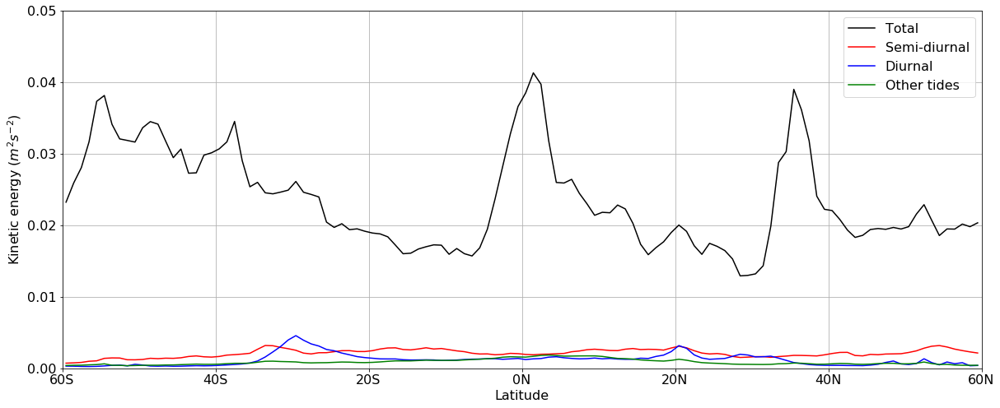

In [12]:
fig, ax = plt.subplots(figsize=(20,8))

labels = ['Total', 'Semi-diurnal', 'Diurnal', 'Other tides']

(E*df).sum(dim='freq_time').plot(color='black', label=labels[0]) # total energy
(E.where((abs(E.freq_cpd)>1.9) & (abs(E.freq_cpd)<2.1) , other=0.)*df).sum(dim='freq_time').plot(color='red', label=labels[1]) # energy around semi-diurnal frequencies
(E.where((abs(E.freq_cpd)>0.9) & (abs(E.freq_cpd)<1.1) , other=0.)*df).sum(dim='freq_time').plot(color='blue', label=labels[2]) # energy around diurnal frequencies
(E.where((abs(E.freq_cpd)>2.1) & (abs(E.freq_cpd)<12) , other=0.)*df).sum(dim='freq_time').plot(color='green', label=labels[3]) # energy associated with higher frequencies (>2 cpd)
ax.legend(prop={'size': 16}); ax.grid()

# x,y ticks
ax.set_xlim(-60., 60.)
ax.set_xticks([-60., -40., -20., 0., 20., 40., 60.])
ax.set_xticklabels(['60S','40S','20S','0N','20N','40N','60N'])
ax.set_ylim([0,0.05])
ax.set_xlabel('Latitude',fontsize=16)
ax.set_ylabel('Kinetic energy ($m^2 s^{-2}$)',fontsize=16)
ax.tick_params(labelsize=16)



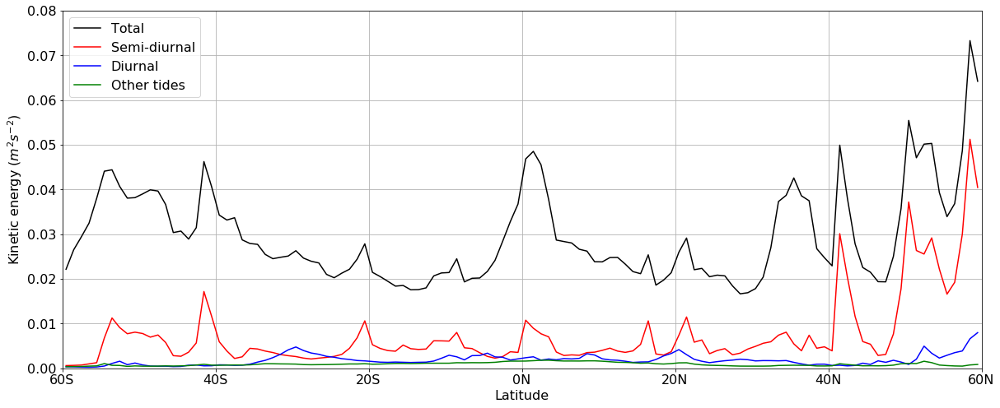

In [12]:
fig, ax = plt.subplots(figsize=(20,8))

labels = ['Total', 'Semi-diurnal', 'Diurnal', 'Other tides']

(E*df).sum(dim='freq_time').plot(color='black', label=labels[0]) # total energy
(E.where((abs(E.freq_cpd)>1.9) & (abs(E.freq_cpd)<2.1) , other=0.)*df).sum(dim='freq_time').plot(color='red', label=labels[1]) # energy around semi-diurnal frequencies
(E.where((abs(E.freq_cpd)>0.9) & (abs(E.freq_cpd)<1.1) , other=0.)*df).sum(dim='freq_time').plot(color='blue', label=labels[2]) # energy around diurnal frequencies
(E.where((abs(E.freq_cpd)>2.1) & (abs(E.freq_cpd)<12) , other=0.)*df).sum(dim='freq_time').plot(color='green', label=labels[3]) # energy associated with higher frequencies (>2 cpd)
ax.legend(prop={'size': 16}); ax.grid()

# x,y ticks
ax.set_xlim(-60., 60.)
ax.set_xticks([-60., -40., -20., 0., 20., 40., 60.])
ax.set_xticklabels(['60S','40S','20S','0N','20N','40N','60N'])
ax.set_ylim([0,0.08])
ax.set_xlabel('Latitude',fontsize=16)
ax.set_ylabel('Kinetic energy ($m^2 s^{-2}$)',fontsize=16)
ax.tick_params(labelsize=16)


## 2.2 Total energy vs near-inetial energy

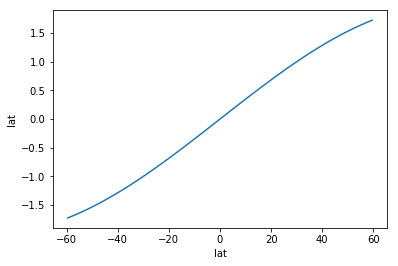

In [21]:
f = 2.*2.*np.pi/86400. * np.sin(np.deg2rad(E.lat))
f_cpd = f*86400/2./np.pi
f_cpd.plot()

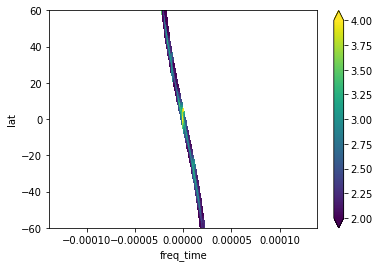

In [31]:
np.log10(E.where(abs(E.freq_cpd+f_cpd)<.2, other=0.)).plot(vmin=2, vmax=4)

## 2.4 Total energy vs Band-frequency integral

In [31]:
np.arcsin(0.25)*180/np.pi

14.477512185929923

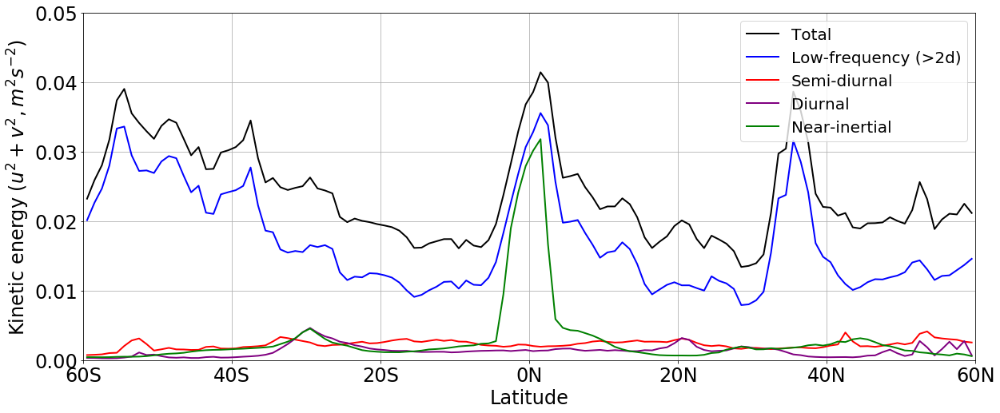

In [28]:
fig, ax = plt.subplots(figsize=(20,8))

labels = ['Total', 'Low-frequency (>2d)','Semi-diurnal', 'Diurnal', 'Near-inertial']


(E*df).sum(dim='freq_time').plot(color='black', label=labels[0], linewidth=2.0) # total energy
(E.where((abs(E.freq_cpd)>0) & (abs(E.freq_cpd)<0.5) , other=0.)*df).sum(dim='freq_time').plot(color='blue', label=labels[1], linewidth=2.0)   # energy at low frequencies (> 5 days) 
(E.where((abs(E.freq_cpd)>1.9) & (abs(E.freq_cpd)<2.1) , other=0.)*df).sum(dim='freq_time').plot(color='red', label=labels[2], linewidth=2.0) # energy around semi-diurnal frequencies
(E.where((abs(E.freq_cpd)>0.9) & (abs(E.freq_cpd)<1.1) , other=0.)*df).sum(dim='freq_time').plot(color='purple', label=labels[3], linewidth=2.0) # energy around diurnal frequencies
(E.where(abs(E.freq_cpd+f_cpd)<.1, other=0.)*df).sum(dim='freq_time').plot(color='green', label=labels[4], linewidth=2.0) # energy around f
ax.legend(prop={'size': 20}); ax.grid()

# x,y ticks
ax.set_xlim(-60., 60.)
ax.set_xticks([-60., -40., -20., 0., 20., 40., 60.])
ax.set_xticklabels(['60S','40S','20S','0N','20N','40N','60N'])
ax.set_ylim([0,0.05])

# Label, size
ax.set_xlabel('Latitude',fontsize=24)
ax.set_ylabel('Kinetic energy ($u^2 + v^2, m^2 s^{-2}$)',fontsize=24)
ax.tick_params(labelsize=24)

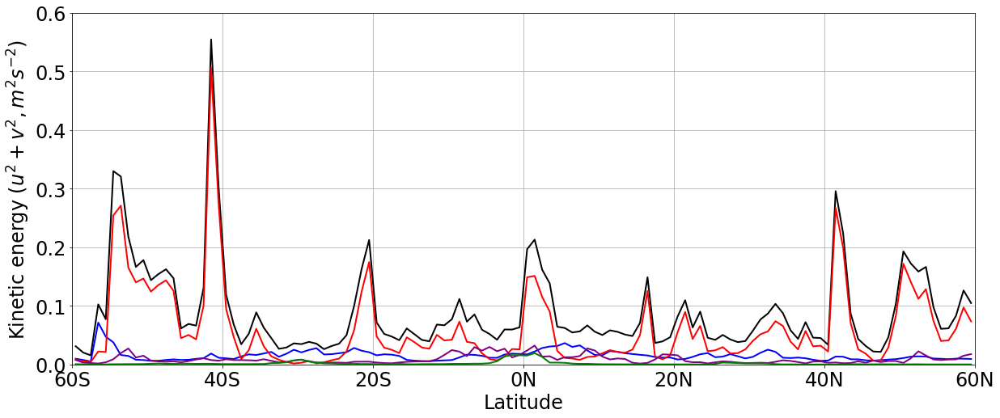

In [24]:
fig, ax = plt.subplots(figsize=(20,8))

labels = ['Total', 'Low-frequency (>2d)','Semi-diurnal', 'Diurnal', 'Near-inertial']


(E*df).sum(dim='freq_time').plot(color='black', label=labels[0], linewidth=2.0) # total energy
(E.where((abs(E.freq_cpd)>0) & (abs(E.freq_cpd)<0.5) , other=0.)*df).sum(dim='freq_time').plot(color='blue', label=labels[1], linewidth=2.0)   # energy at low frequencies (> 5 days) 
(E.where((abs(E.freq_cpd)>1.9) & (abs(E.freq_cpd)<2.1) , other=0.)*df).sum(dim='freq_time').plot(color='red', label=labels[2], linewidth=2.0) # energy around semi-diurnal frequencies
(E.where((abs(E.freq_cpd)>0.9) & (abs(E.freq_cpd)<1.1) , other=0.)*df).sum(dim='freq_time').plot(color='purple', label=labels[3], linewidth=2.0) # energy around diurnal frequencies
(E.where(abs(E.freq_cpd+f_cpd)<.1, other=0.)*df).sum(dim='freq_time').plot(color='green', label=labels[4], linewidth=2.0) # energy around f
#ax.legend(prop={'size': 20}); 
ax.grid()


# x,y ticks
ax.set_xlim(-60., 60.)
ax.set_xticks([-60., -40., -20., 0., 20., 40., 60.])
ax.set_xticklabels(['60S','40S','20S','0N','20N','40N','60N'])
#ax.set_ylim([0,0.08])
ax.set_ylim([0,0.6])


# Label, size
ax.set_xlabel('Latitude',fontsize=24)
ax.set_ylabel('Kinetic energy ($u^2 + v^2, m^2 s^{-2}$)',fontsize=24)
ax.tick_params(labelsize=24)

#plt.savefig('/home1/datahome/xyu/equinox_working/sandbox/Figures/Freq-integral KE_openocean.png')
plt.savefig('/home1/datahome/xyu/equinox_working/sandbox/Figures/Freq-integral KE_coastalocean.png')

# 3. face-averaged spectra

## 3.1 Compute globally-averaged spectra

In [172]:
filenames_u = sorted(glob(E_dir+'E_uv_f*.nc'))

# Read SSU #
ds = xr.open_mfdataset(filenames_u, chunks={'i':10, 'j':432}, concat_dim='face', compat='equals')
chunks={'face': len(ds['face'])}
ds = ds.chunk(chunks)
print(ds)

distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


<xarray.Dataset>
Dimensions:            (face: 9, freq_time: 1440, i: 4320, j: 4320)
Coordinates:
  * i                  (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 ...
  * j                  (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 ...
  * freq_time          (freq_time) float64 0.0 1.929e-07 3.858e-07 5.787e-07 ...
    freq_time_spacing  float64 1.929e-07
  * face               (face) int64 0 1 2 4 5 7 8 10 11
    XC                 (face, i, j) float32 dask.array<shape=(9, 4320, 4320), chunksize=(9, 10, 432)>
    YC                 (face, i, j) float32 dask.array<shape=(9, 4320, 4320), chunksize=(9, 10, 432)>
    rA                 (face, i, j) float32 dask.array<shape=(9, 4320, 4320), chunksize=(9, 10, 432)>
    Depth              (face, i, j) float32 dask.array<shape=(9, 4320, 4320), chunksize=(9, 10, 432)>
Data variables:
    E_uv               (face, i, j, freq_time) float64 dask.array<shape=(9, 4320, 4320, 1440), chunksize=(9, 10, 432, 1440)>


(array([0., 0., 0., 0., 0., 1., 0., 0., 0., 0.]),
 array([-57.50102615, -57.40102615, -57.30102615, -57.20102615,
        -57.10102615, -57.00102615, -56.90102615, -56.80102615,
        -56.70102615, -56.60102615, -56.50102615]),
 <a list of 10 Patch objects>)

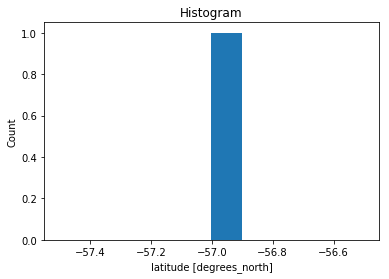

In [22]:
ds.YC.isel(face=1,i=10,j=0).plot()

### 3.1.1 All the world oceans

In [12]:
E_uv = (ds.E_uv).where(ds.YC>0.).mean(dim=('i','j','face'))   
file_E = E_dir+'E_uv_north_mean.nc'  
%time E_uv.to_netcdf(file_E, mode='w')  

/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/site-packages/dask/utils.py:1010: UserWarning: Deprecated, see dask.base.get_scheduler instead
  warnings.warn("Deprecated, see dask.base.get_scheduler instead")
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


CPU times: user 47min 10s, sys: 1min 22s, total: 48min 32s
Wall time: 1h 8min 43s


In [13]:
E_uv = (ds.E_uv).where(ds.YC<0.).mean(dim=('i','j','face'))   
file_E = E_dir+'E_uv_south_mean.nc'  
%time E_uv.to_netcdf(file_E, mode='w')  

/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/site-packages/dask/utils.py:1010: UserWarning: Deprecated, see dask.base.get_scheduler instead
  warnings.warn("Deprecated, see dask.base.get_scheduler instead")
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


CPU times: user 49min 52s, sys: 1min 30s, total: 51min 23s
Wall time: 1h 9min 47s


### 3.1.2 Open ocean

In [ ]:
E_uv = ((ds.E_uv).where((ds.YC>0.) & (ds.Depth>200.))).mean(dim=('i','j','face'))   
file_E = E_dir+'E_uv_north_allmean_openocean.nc'  
%time E_uv.to_netcdf(file_E, mode='w')  

distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took

In [7]:
E_uv = ((ds.E_uv).where((ds.YC<0.) & (ds.Depth>200.))).mean(dim=('i','j','face'))   
file_E = E_dir+'E_uv_south_allmean_openocean.nc'  
%time E_uv.to_netcdf(file_E, mode='w')  

distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took

CPU times: user 42min 36s, sys: 1min 47s, total: 44min 23s
Wall time: 2h 26min 6s


### 3.1.3 Coastal ocean

In [ ]:
E_uv = ((ds.E_uv).where((ds.YC>0.) & (ds.Depth<200.))).mean(dim=('i','j','face'))   
file_E = E_dir+'E_uv_north_allmean_coastalocean.nc'  
%time E_uv.to_netcdf(file_E, mode='w')  

In [ ]:
E_uv = ((ds.E_uv).where((ds.YC<0.) & (ds.Depth<200.))).mean(dim=('i','j','face'))   
file_E = E_dir+'E_uv_south_allmean_coastalocean.nc'  
%time E_uv.to_netcdf(file_E, mode='w')  

## 3.2 Read results and plot figures_all oceans

In [6]:
face =1 

filenames_u = sorted(glob(E_dir+'E_uv_south_mean.nc'))

# Grid #
grid = mgrid.isel(face=face)
# Read SSU #
ds = xr.open_mfdataset(filenames_u)
print(ds)

<xarray.Dataset>
Dimensions:                        (freq_time: 1440)
Coordinates:
  * freq_time                      (freq_time) float64 0.0 1.929e-07 ...
    freq_time_spacing              float64 ...
Data variables:
    __xarray_dataarray_variable__  (freq_time) float64 dask.array<shape=(1440,), chunksize=(1440,)>


In [7]:
E_south = ds.__xarray_dataarray_variable__
E_south = E_south.assign_coords(freq_time=ds.__xarray_dataarray_variable__.freq_time * 86400.) 
print(E_south)

<xarray.DataArray '__xarray_dataarray_variable__' (freq_time: 1440)>
dask.array<shape=(1440,), dtype=float64, chunksize=(1440,)>
Coordinates:
  * freq_time          (freq_time) float64 0.0 0.01667 0.03333 0.05 0.06667 ...
    freq_time_spacing  float64 ...


In [8]:
E0_south = E_south/8.64

In [9]:
#filenames_u = sorted(glob(E_dir+'E_uv_allface_mean.nc'))
filenames_u = sorted(glob(E_dir+'E_uv_north_mean.nc'))

# Grid #
grid = mgrid.isel(face=face)
# Read SSU #
ds0 = xr.open_mfdataset(filenames_u)
print(ds0)

<xarray.Dataset>
Dimensions:                        (freq_time: 1440)
Coordinates:
  * freq_time                      (freq_time) float64 0.0 1.929e-07 ...
    freq_time_spacing              float64 ...
Data variables:
    __xarray_dataarray_variable__  (freq_time) float64 dask.array<shape=(1440,), chunksize=(1440,)>


In [10]:
E_north = ds0.__xarray_dataarray_variable__
E_north = E_north.assign_coords(freq_time=ds0.__xarray_dataarray_variable__.freq_time * 86400.) 
print(E_north)

<xarray.DataArray '__xarray_dataarray_variable__' (freq_time: 1440)>
dask.array<shape=(1440,), dtype=float64, chunksize=(1440,)>
Coordinates:
  * freq_time          (freq_time) float64 0.0 0.01667 0.03333 0.05 0.06667 ...
    freq_time_spacing  float64 ...


In [11]:
E0_north = E_north/8.64

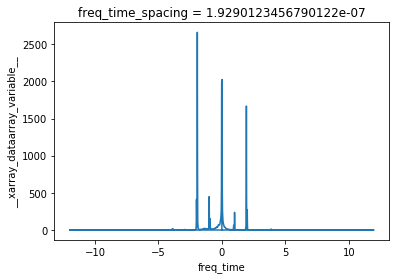

In [12]:
E0_north.plot()

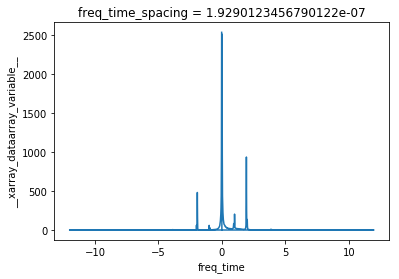

In [13]:
E0_south.plot()

In [14]:
E0_south_anti = E0_south.where(E0_south.freq_time>0)
print(E0_south_anti)

E0_north_anti = E0_north.where(E0_north.freq_time<0)
E0_north_anti = E0_north_anti.assign_coords(freq_time=E_north.freq_time * -1.) 
print(E0_north_anti)

<xarray.DataArray (freq_time: 1440)>
dask.array<shape=(1440,), dtype=float64, chunksize=(1440,)>
Coordinates:
  * freq_time          (freq_time) float64 0.0 0.01667 0.03333 0.05 0.06667 ...
    freq_time_spacing  float64 1.929e-07
<xarray.DataArray (freq_time: 1440)>
dask.array<shape=(1440,), dtype=float64, chunksize=(1440,)>
Coordinates:
  * freq_time          (freq_time) float64 -0.0 -0.01667 -0.03333 -0.05 ...
    freq_time_spacing  float64 ...


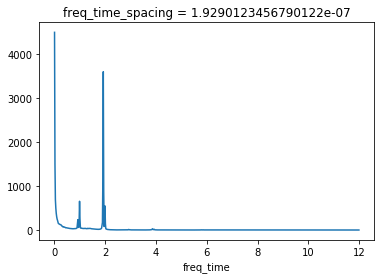

In [15]:
E0_anti = E0_north_anti + E0_south_anti
E0_anti.plot()

In [16]:
E0_south_cycl = E0_south.where(E0_south.freq_time<0)
print(E0_south_cycl)

E0_north_cycl = E0_north.where(E0_north.freq_time>0)
E0_north_cycl = E0_north_cycl.assign_coords(freq_time=E_north.freq_time * -1.) 
print(E0_north_cycl)

<xarray.DataArray (freq_time: 1440)>
dask.array<shape=(1440,), dtype=float64, chunksize=(1440,)>
Coordinates:
  * freq_time          (freq_time) float64 0.0 0.01667 0.03333 0.05 0.06667 ...
    freq_time_spacing  float64 1.929e-07
<xarray.DataArray (freq_time: 1440)>
dask.array<shape=(1440,), dtype=float64, chunksize=(1440,)>
Coordinates:
  * freq_time          (freq_time) float64 -0.0 -0.01667 -0.03333 -0.05 ...
    freq_time_spacing  float64 ...


In [17]:
E0_cycl = E0_north_cycl + E0_south_cycl
E0_cycl = E0_cycl.assign_coords(freq_time=E0_cycl.freq_time * -1.) 

print(E0_cycl)

<xarray.DataArray (freq_time: 1439)>
dask.array<shape=(1439,), dtype=float64, chunksize=(1439,)>
Coordinates:
  * freq_time          (freq_time) float64 -0.0 0.01667 0.03333 0.05 0.06667 ...
    freq_time_spacing  float64 1.929e-07


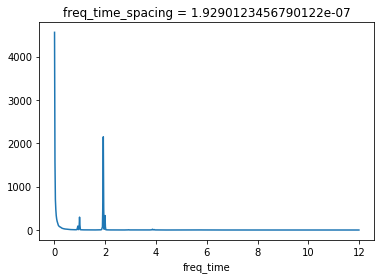

In [18]:
E0_cycl.plot()

In [19]:
E_cycl_all = E0_cycl
E_anti_all = E0_anti

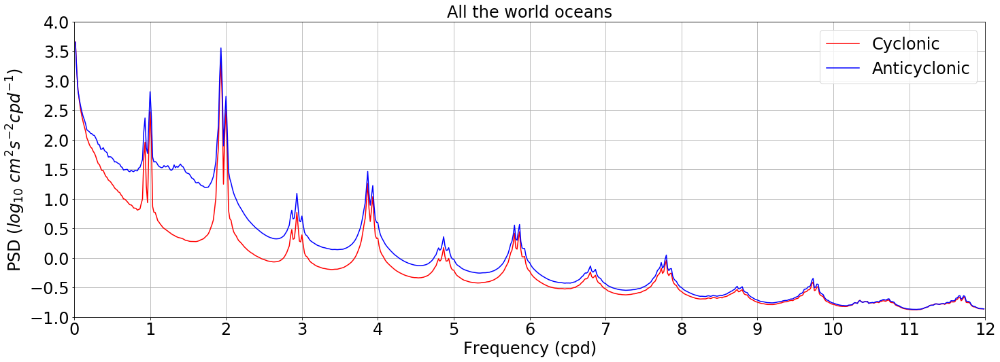

In [20]:

fig, ax = plt.subplots(figsize=(24,8))

labels = ['Cyclonic', 'Anticyclonic']

(np.log10(E_cycl_all).where(E_cycl_all.freq_time>0)).plot(ax=ax,color='red', label=labels[0])
(np.log10(E_anti_all).where(E_anti_all.freq_time>0)).plot(ax=ax,color='blue', label=labels[1])

ax.legend(); ax.grid()
#ax.set_yscale('log')
ax.set_ylim([-1.,4.])
ax.set_yticks([-1, -0.5, 0., 0.5, 1., 1.5, 2., 2.5, 3., 3.5, 4.])

ax.set_xlim([0.,12.])
#ax.set_ylim([1e-1,1e4])


ax.set_xticks([0., 1., 2., 3., 4., 5., 6., 7., 8., 9., 10., 11., 12.])
ax.legend(prop={'size': 24})
ax.set_ylabel('PSD ($log_{10}\ cm^2 s^{-2} cpd^{-1})$',fontsize=24)
ax.set_xlabel('Frequency (cpd)',fontsize=24)
ax.tick_params(labelsize=24)
ax.set_title('All the world oceans',fontsize=24)


plt.savefig('/home1/datahome/xyu/equinox_working/sandbox/Figures/Globally_averaged_PSD_alloceans.png')



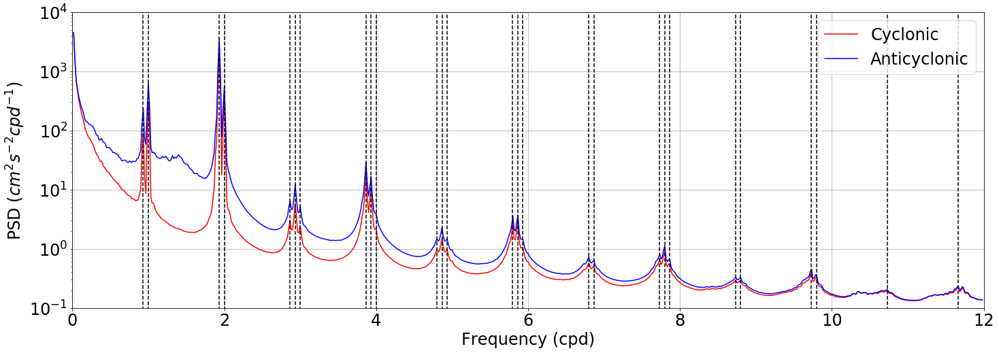

In [30]:

fig, ax = plt.subplots(figsize=(24,8))

labels = ['Cyclonic', 'Anticyclonic']

(E0_cycl.where(E0_cycl.freq_time>0)).plot(ax=ax,color='red', label=labels[0])
(E0_anti.where(E0_anti.freq_time>0)).plot(ax=ax,color='blue', label=labels[1])

ax.legend(); ax.grid()
ax.set_yscale('log')
#ax.set_ylim([-0.5,4.5])
#ax.set_yticks([-0.5, 0., 0.5, 1., 1.5, 2., 2.5, 3., 3.5, 4., 4.5])

ax.set_xlim([0.,12.])
ax.set_ylim([1e-1,1e4])


#ax.set_xticks([0., 1., 2., 3., 4., 5., 6., 7., 8., 9., 10., 11., 12.])
ax.legend(prop={'size': 24})
ax.set_ylabel('PSD ($cm^2 s^{-2} cpd^{-1})$',fontsize=24)
ax.set_xlabel('Frequency (cpd)',fontsize=24)
ax.tick_params(labelsize=24)
ax.set_title('')

# Diurnal frequencies
ax.plot([24/25.81933871,24/25.81933871],[1e-2,1e6],'k--') # O1
ax.plot([1,1],[1e-2,1e6],'k--') # S1

# Semi-diurnal frequencies
ax.plot([1.93227,1.93227],[1e-2,1e6],'k--') # M2
ax.plot([2,2],[1e-2,1e6],'k--') # S2

# 3
ax.plot([2.86181,2.86181],[1e-2,1e6],'k--') # MO3
ax.plot([2.93501,2.93501],[1e-2,1e6],'k--') # MK3
ax.plot([3.00274,3.00274],[1e-2,1e6],'k--') # SK3

# 4
ax.plot([3.86455,3.86455],[1e-2,1e6],'k--') # M4
ax.plot([3.93227,3.93227],[1e-2,1e6],'k--') # MS4
ax.plot([4,4],[1e-2,1e6],'k--') # S4

# 5
ax.plot([4.79956,4.79956],[1e-2,1e6],'k--') # 3MP5
ax.plot([4.86729,4.86729],[1e-2,1e6],'k--') # 2MK5
ax.plot([4.93501,4.93501],[1e-2,1e6],'k--') # MSK5

# 6
ax.plot([5.79682,5.79682],[1e-2,1e6],'k--') # M6
ax.plot([5.86455,5.86455],[1e-2,1e6],'k--') # 2MS6
ax.plot([5.93227,5.93227],[1e-2,1e6],'k--') # 2SM6

# 7
ax.plot([6.79956,6.79956],[1e-2,1e6],'k--') # 3MK7
ax.plot([6.86729,6.86729],[1e-2,1e6],'k--') # ST17

# 8
ax.plot([7.72909,7.72909],[1e-2,1e6],'k--') # M8
ax.plot([7.8023,7.8023],[1e-2,1e6],'k--')   # 3MK8
ax.plot([7.86455,7.86455],[1e-2,1e6],'k--') # ST23

# 9
ax.plot([8.73183,8.73183],[1e-2,1e6],'k--') # M4MK9
ax.plot([8.79956,8.79956],[1e-2,1e6],'k--') # ST27


# 10
ax.plot([9.72909,9.72909],[1e-2,1e6],'k--') # ST30
ax.plot([9.79682,9.79682],[1e-2,1e6],'k--') # ST32

# 11
ax.plot([10.7318,10.7318],[1e-2,1e6],'k--') # ST33


# 12
ax.plot([11.6614,11.6614],[1e-2,1e6],'k--') # ST34

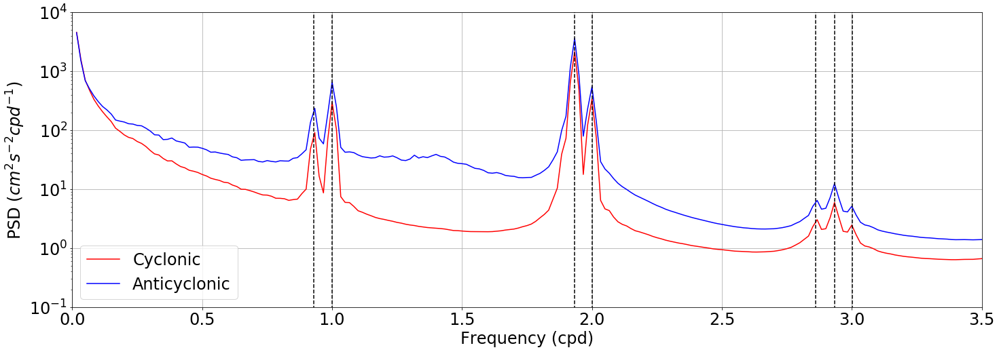

In [31]:

fig, ax = plt.subplots(figsize=(24,8))

labels = ['Cyclonic', 'Anticyclonic']

(E0_cycl.where(E0_cycl.freq_time>0)).plot(ax=ax,color='red', label=labels[0])
(E0_anti.where(E0_anti.freq_time>0)).plot(ax=ax,color='blue', label=labels[1])

ax.legend(); ax.grid()
ax.set_yscale('log')
#ax.set_ylim([-0.5,4.5])
#ax.set_yticks([-0.5, 0., 0.5, 1., 1.5, 2., 2.5, 3., 3.5, 4., 4.5])

ax.set_xlim([0.,3.5])
ax.set_ylim([1e-1,1e4])


#ax.set_xticks([0., 1., 2., 3., 4., 5., 6., 7., 8., 9., 10., 11., 12.])
ax.legend(prop={'size': 24})
ax.set_ylabel('PSD ($cm^2 s^{-2} cpd^{-1})$',fontsize=24)
ax.set_xlabel('Frequency (cpd)',fontsize=24)
ax.tick_params(labelsize=24)
ax.set_title('')

# Diurnal frequencies
ax.plot([24/25.81933871,24/25.81933871],[1e-2,1e6],'k--') # O1
ax.plot([1,1],[1e-2,1e6],'k--') # S1

# Semi-diurnal frequencies
ax.plot([1.93227,1.93227],[1e-2,1e6],'k--') # M2
ax.plot([2,2],[1e-2,1e6],'k--') # S2

# 3
ax.plot([2.86181,2.86181],[1e-2,1e6],'k--') # MO3
ax.plot([2.93501,2.93501],[1e-2,1e6],'k--') # MK3
ax.plot([3.00274,3.00274],[1e-2,1e6],'k--') # SK3

# 4
ax.plot([3.86455,3.86455],[1e-2,1e6],'k--') # M4
ax.plot([3.93227,3.93227],[1e-2,1e6],'k--') # MS4
ax.plot([4,4],[1e-2,1e6],'k--') # S4

# 5
ax.plot([4.79956,4.79956],[1e-2,1e6],'k--') # 3MP5
ax.plot([4.86729,4.86729],[1e-2,1e6],'k--') # 2MK5
ax.plot([4.93501,4.93501],[1e-2,1e6],'k--') # MSK5

# 6
ax.plot([5.79682,5.79682],[1e-2,1e6],'k--') # M6
ax.plot([5.86455,5.86455],[1e-2,1e6],'k--') # 2MS6
ax.plot([5.93227,5.93227],[1e-2,1e6],'k--') # 2SM6

# 7
ax.plot([6.79956,6.79956],[1e-2,1e6],'k--') # 3MK7
ax.plot([6.86729,6.86729],[1e-2,1e6],'k--') # ST17

# 8
ax.plot([7.72909,7.72909],[1e-2,1e6],'k--') # M8
ax.plot([7.8023,7.8023],[1e-2,1e6],'k--')   # 3MK8
ax.plot([7.86455,7.86455],[1e-2,1e6],'k--') # ST23

# 9
ax.plot([8.73183,8.73183],[1e-2,1e6],'k--') # M4MK9
ax.plot([8.79956,8.79956],[1e-2,1e6],'k--') # ST27


# 10
ax.plot([9.72909,9.72909],[1e-2,1e6],'k--') # ST30
ax.plot([9.79682,9.79682],[1e-2,1e6],'k--') # ST32

# 11
ax.plot([10.7318,10.7318],[1e-2,1e6],'k--') # ST33


# 12
ax.plot([11.6614,11.6614],[1e-2,1e6],'k--') # ST34

#plt.savefig('/home1/datahome/xyu/equinox_working/sandbox/Figures/Globally_averaged_PSD_nowindow_1.png')



No handles with labels found to put in legend.
No handles with labels found to put in legend.


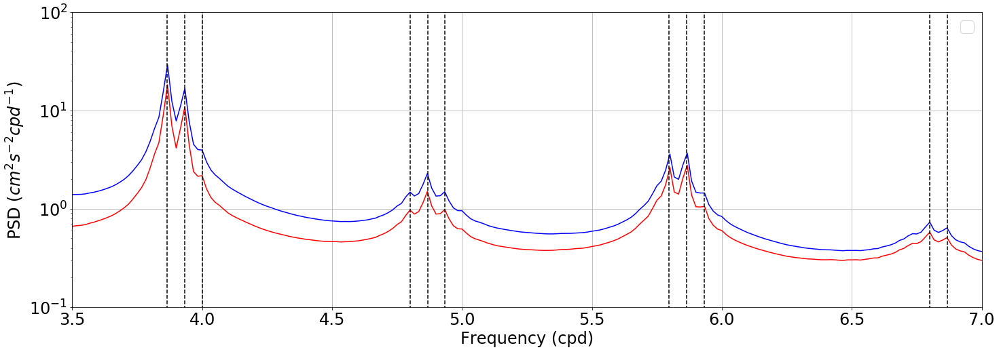

In [32]:

fig, ax = plt.subplots(figsize=(24,8))

labels = ['Cyclonic', 'Anticyclonic']

(E0_cycl.where(E0_cycl.freq_time>0)).plot(ax=ax,color='red')
(E0_anti.where(E0_anti.freq_time>0)).plot(ax=ax,color='blue')

ax.legend(); ax.grid()
ax.set_yscale('log')
#ax.set_ylim([-0.5,4.5])
#ax.set_yticks([-0.5, 0., 0.5, 1., 1.5, 2., 2.5, 3., 3.5, 4., 4.5])

ax.set_xlim([3.5,7.])
ax.set_ylim([1e-1,1e2])


#ax.set_xticks([0., 1., 2., 3., 4., 5., 6., 7., 8., 9., 10., 11., 12.])
ax.legend(prop={'size': 24})
ax.set_ylabel('PSD ($cm^2 s^{-2} cpd^{-1})$',fontsize=24)
ax.set_xlabel('Frequency (cpd)',fontsize=24)
ax.tick_params(labelsize=24)
ax.set_title('')

# Diurnal frequencies
ax.plot([24/25.81933871,24/25.81933871],[1e-2,1e6],'k--') # O1
ax.plot([1,1],[1e-2,1e6],'k--') # S1

# Semi-diurnal frequencies
ax.plot([1.93227,1.93227],[1e-2,1e6],'k--') # M2
ax.plot([2,2],[1e-2,1e6],'k--') # S2

# 3
ax.plot([2.86181,2.86181],[1e-2,1e6],'k--') # MO3
ax.plot([2.93501,2.93501],[1e-2,1e6],'k--') # MK3
ax.plot([3.00274,3.00274],[1e-2,1e6],'k--') # SK3

# 4
ax.plot([3.86455,3.86455],[1e-2,1e6],'k--') # M4
ax.plot([3.93227,3.93227],[1e-2,1e6],'k--') # MS4
ax.plot([4,4],[1e-2,1e6],'k--') # S4

# 5
ax.plot([4.79956,4.79956],[1e-2,1e6],'k--') # 3MP5
ax.plot([4.86729,4.86729],[1e-2,1e6],'k--') # 2MK5
ax.plot([4.93501,4.93501],[1e-2,1e6],'k--') # MSK5

# 6
ax.plot([5.79682,5.79682],[1e-2,1e6],'k--') # M6
ax.plot([5.86455,5.86455],[1e-2,1e6],'k--') # 2MS6
ax.plot([5.93227,5.93227],[1e-2,1e6],'k--') # 2SM6

# 7
ax.plot([6.79956,6.79956],[1e-2,1e6],'k--') # 3MK7
ax.plot([6.86729,6.86729],[1e-2,1e6],'k--') # ST17

# 8
ax.plot([7.72909,7.72909],[1e-2,1e6],'k--') # M8
ax.plot([7.8023,7.8023],[1e-2,1e6],'k--')   # 3MK8
ax.plot([7.86455,7.86455],[1e-2,1e6],'k--') # ST23

# 9
ax.plot([8.73183,8.73183],[1e-2,1e6],'k--') # M4MK9
ax.plot([8.79956,8.79956],[1e-2,1e6],'k--') # ST27


# 10
ax.plot([9.72909,9.72909],[1e-2,1e6],'k--') # ST30
ax.plot([9.79682,9.79682],[1e-2,1e6],'k--') # ST32

# 11
ax.plot([10.7318,10.7318],[1e-2,1e6],'k--') # ST33


# 12
ax.plot([11.6614,11.6614],[1e-2,1e6],'k--') # ST34

#plt.savefig('/home1/datahome/xyu/equinox_working/sandbox/Figures/Globally_averaged_PSD_nowindow_2.png')



No handles with labels found to put in legend.
No handles with labels found to put in legend.


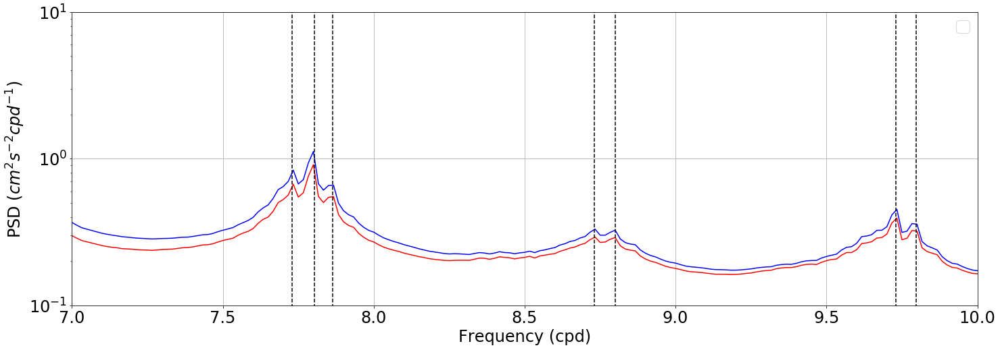

In [33]:

fig, ax = plt.subplots(figsize=(24,8))

labels = ['Cyclonic', 'Anticyclonic']

(E0_cycl.where(E0_cycl.freq_time>0)).plot(ax=ax,color='red')
(E0_anti.where(E0_anti.freq_time>0)).plot(ax=ax,color='blue')

ax.legend(); ax.grid()
ax.set_yscale('log')
#ax.set_ylim([-0.5,4.5])
#ax.set_yticks([-0.5, 0., 0.5, 1., 1.5, 2., 2.5, 3., 3.5, 4., 4.5])

ax.set_xlim([7.,10.])
ax.set_ylim([1e-1,1e1])


#ax.set_xticks([0., 1., 2., 3., 4., 5., 6., 7., 8., 9., 10., 11., 12.])
ax.legend(prop={'size': 24})
ax.set_ylabel('PSD ($cm^2 s^{-2} cpd^{-1})$',fontsize=24)
ax.set_xlabel('Frequency (cpd)',fontsize=24)
ax.tick_params(labelsize=24)
ax.set_title('')

# Diurnal frequencies
ax.plot([24/25.81933871,24/25.81933871],[1e-2,1e6],'k--') # O1
ax.plot([1,1],[1e-2,1e6],'k--') # S1

# Semi-diurnal frequencies
ax.plot([1.93227,1.93227],[1e-2,1e6],'k--') # M2
ax.plot([2,2],[1e-2,1e6],'k--') # S2

# 3
ax.plot([2.86181,2.86181],[1e-2,1e6],'k--') # MO3
ax.plot([2.93501,2.93501],[1e-2,1e6],'k--') # MK3
ax.plot([3.00274,3.00274],[1e-2,1e6],'k--') # SK3

# 4
ax.plot([3.86455,3.86455],[1e-2,1e6],'k--') # M4
ax.plot([3.93227,3.93227],[1e-2,1e6],'k--') # MS4
ax.plot([4,4],[1e-2,1e6],'k--') # S4

# 5
ax.plot([4.79956,4.79956],[1e-2,1e6],'k--') # 3MP5
ax.plot([4.86729,4.86729],[1e-2,1e6],'k--') # 2MK5
ax.plot([4.93501,4.93501],[1e-2,1e6],'k--') # MSK5

# 6
ax.plot([5.79682,5.79682],[1e-2,1e6],'k--') # M6
ax.plot([5.86455,5.86455],[1e-2,1e6],'k--') # 2MS6
ax.plot([5.93227,5.93227],[1e-2,1e6],'k--') # 2SM6

# 7
ax.plot([6.79956,6.79956],[1e-2,1e6],'k--') # 3MK7
ax.plot([6.86729,6.86729],[1e-2,1e6],'k--') # ST17

# 8
ax.plot([7.72909,7.72909],[1e-2,1e6],'k--') # M8
ax.plot([7.8023,7.8023],[1e-2,1e6],'k--')   # 3MK8
ax.plot([7.86455,7.86455],[1e-2,1e6],'k--') # ST23

# 9
ax.plot([8.73183,8.73183],[1e-2,1e6],'k--') # M4MK9
ax.plot([8.79956,8.79956],[1e-2,1e6],'k--') # ST27


# 10
ax.plot([9.72909,9.72909],[1e-2,1e6],'k--') # ST30
ax.plot([9.79682,9.79682],[1e-2,1e6],'k--') # ST32

# 11
ax.plot([10.7318,10.7318],[1e-2,1e6],'k--') # ST33


# 12
ax.plot([11.6614,11.6614],[1e-2,1e6],'k--') # ST34

#plt.savefig('/home1/datahome/xyu/equinox_working/sandbox/Figures/Globally_averaged_PSD_nowindow_3.png')



No handles with labels found to put in legend.
No handles with labels found to put in legend.


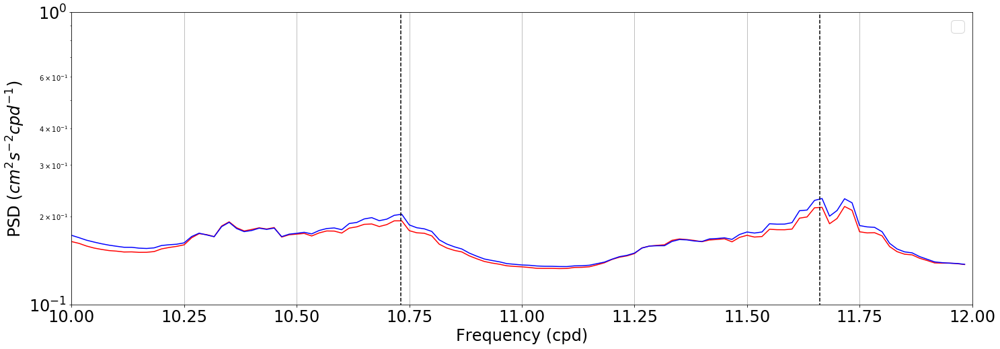

In [34]:

fig, ax = plt.subplots(figsize=(24,8))

labels = ['Cyclonic', 'Anticyclonic']

(E0_cycl.where(E0_cycl.freq_time>0)).plot(ax=ax,color='red')
(E0_anti.where(E0_anti.freq_time>0)).plot(ax=ax,color='blue')

ax.legend(); ax.grid()
ax.set_yscale('log')
#ax.set_ylim([-0.5,4.5])
#ax.set_yticks([-0.5, 0., 0.5, 1., 1.5, 2., 2.5, 3., 3.5, 4., 4.5])

ax.set_xlim([10.,12.])
ax.set_ylim([1e-1,1e0])


#ax.set_xticks([0., 1., 2., 3., 4., 5., 6., 7., 8., 9., 10., 11., 12.])
ax.legend(prop={'size': 24})
ax.set_ylabel('PSD ($cm^2 s^{-2} cpd^{-1})$',fontsize=24)
ax.set_xlabel('Frequency (cpd)',fontsize=24)
ax.tick_params(labelsize=24)
ax.set_title('')

# Diurnal frequencies
ax.plot([24/25.81933871,24/25.81933871],[1e-2,1e6],'k--') # O1
ax.plot([1,1],[1e-2,1e6],'k--') # S1

# Semi-diurnal frequencies
ax.plot([1.93227,1.93227],[1e-2,1e6],'k--') # M2
ax.plot([2,2],[1e-2,1e6],'k--') # S2

# 3
ax.plot([2.86181,2.86181],[1e-2,1e6],'k--') # MO3
ax.plot([2.93501,2.93501],[1e-2,1e6],'k--') # MK3
ax.plot([3.00274,3.00274],[1e-2,1e6],'k--') # SK3

# 4
ax.plot([3.86455,3.86455],[1e-2,1e6],'k--') # M4
ax.plot([3.93227,3.93227],[1e-2,1e6],'k--') # MS4
ax.plot([4,4],[1e-2,1e6],'k--') # S4

# 5
ax.plot([4.79956,4.79956],[1e-2,1e6],'k--') # 3MP5
ax.plot([4.86729,4.86729],[1e-2,1e6],'k--') # 2MK5
ax.plot([4.93501,4.93501],[1e-2,1e6],'k--') # MSK5

# 6
ax.plot([5.79682,5.79682],[1e-2,1e6],'k--') # M6
ax.plot([5.86455,5.86455],[1e-2,1e6],'k--') # 2MS6
ax.plot([5.93227,5.93227],[1e-2,1e6],'k--') # 2SM6

# 7
ax.plot([6.79956,6.79956],[1e-2,1e6],'k--') # 3MK7
ax.plot([6.86729,6.86729],[1e-2,1e6],'k--') # ST17

# 8
ax.plot([7.72909,7.72909],[1e-2,1e6],'k--') # M8
ax.plot([7.8023,7.8023],[1e-2,1e6],'k--')   # 3MK8
ax.plot([7.86455,7.86455],[1e-2,1e6],'k--') # ST23

# 9
ax.plot([8.73183,8.73183],[1e-2,1e6],'k--') # M4MK9
ax.plot([8.79956,8.79956],[1e-2,1e6],'k--') # ST27


# 10
ax.plot([9.72909,9.72909],[1e-2,1e6],'k--') # ST30
ax.plot([9.79682,9.79682],[1e-2,1e6],'k--') # ST32

# 11
ax.plot([10.7318,10.7318],[1e-2,1e6],'k--') # ST33


# 12
ax.plot([11.6614,11.6614],[1e-2,1e6],'k--') # ST34

#plt.savefig('/home1/datahome/xyu/equinox_working/sandbox/Figures/Globally_averaged_PSD_nowindow_4.png')



## 3.3 Read results and plot figures_open oceans

In [21]:
face =1 

filenames_u = sorted(glob(E_dir+'E_uv_south_allmean_openocean.nc'))

# Grid #
grid = mgrid.isel(face=face)
# Read SSU #
ds = xr.open_mfdataset(filenames_u)
print(ds)

<xarray.Dataset>
Dimensions:                        (freq_time: 1440)
Coordinates:
  * freq_time                      (freq_time) float64 0.0 1.929e-07 ...
    freq_time_spacing              float64 ...
Data variables:
    __xarray_dataarray_variable__  (freq_time) float64 dask.array<shape=(1440,), chunksize=(1440,)>


In [22]:
E_south = ds.__xarray_dataarray_variable__
E_south = E_south.assign_coords(freq_time=ds.__xarray_dataarray_variable__.freq_time * 86400.) 
print(E_south)

<xarray.DataArray '__xarray_dataarray_variable__' (freq_time: 1440)>
dask.array<shape=(1440,), dtype=float64, chunksize=(1440,)>
Coordinates:
  * freq_time          (freq_time) float64 0.0 0.01667 0.03333 0.05 0.06667 ...
    freq_time_spacing  float64 ...


In [23]:
E0_south = E_south/8.64

In [24]:
#filenames_u = sorted(glob(E_dir+'E_uv_allface_mean.nc'))
filenames_u = sorted(glob(E_dir+'E_uv_north_allmean_openocean.nc'))

# Grid #
grid = mgrid.isel(face=face)
# Read SSU #
ds0 = xr.open_mfdataset(filenames_u)
print(ds0)

<xarray.Dataset>
Dimensions:                        (freq_time: 1440)
Coordinates:
  * freq_time                      (freq_time) float64 0.0 1.929e-07 ...
    freq_time_spacing              float64 ...
Data variables:
    __xarray_dataarray_variable__  (freq_time) float64 dask.array<shape=(1440,), chunksize=(1440,)>


In [25]:
E_north = ds0.__xarray_dataarray_variable__
E_north = E_north.assign_coords(freq_time=ds0.__xarray_dataarray_variable__.freq_time * 86400.) 
print(E_north)

<xarray.DataArray '__xarray_dataarray_variable__' (freq_time: 1440)>
dask.array<shape=(1440,), dtype=float64, chunksize=(1440,)>
Coordinates:
  * freq_time          (freq_time) float64 0.0 0.01667 0.03333 0.05 0.06667 ...
    freq_time_spacing  float64 ...


In [26]:
E0_north = E_north/8.64

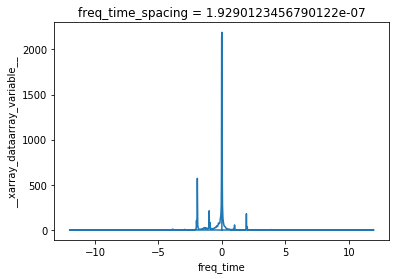

In [27]:
E0_north.plot()

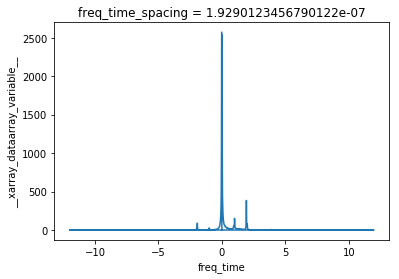

In [28]:
E0_south.plot()

In [29]:
E0_south_anti = E0_south.where(E0_south.freq_time>0)
print(E0_south_anti)

E0_north_anti = E0_north.where(E0_north.freq_time<0)
E0_north_anti = E0_north_anti.assign_coords(freq_time=E_north.freq_time * -1.) 
print(E0_north_anti)

<xarray.DataArray (freq_time: 1440)>
dask.array<shape=(1440,), dtype=float64, chunksize=(1440,)>
Coordinates:
  * freq_time          (freq_time) float64 0.0 0.01667 0.03333 0.05 0.06667 ...
    freq_time_spacing  float64 1.929e-07
<xarray.DataArray (freq_time: 1440)>
dask.array<shape=(1440,), dtype=float64, chunksize=(1440,)>
Coordinates:
  * freq_time          (freq_time) float64 -0.0 -0.01667 -0.03333 -0.05 ...
    freq_time_spacing  float64 ...


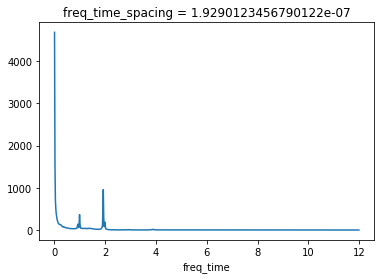

In [30]:
E0_anti = E0_north_anti + E0_south_anti
E0_anti.plot()

In [31]:
E0_south_cycl = E0_south.where(E0_south.freq_time<0)
print(E0_south_cycl)

E0_north_cycl = E0_north.where(E0_north.freq_time>0)
E0_north_cycl = E0_north_cycl.assign_coords(freq_time=E_north.freq_time * -1.) 
print(E0_north_cycl)

<xarray.DataArray (freq_time: 1440)>
dask.array<shape=(1440,), dtype=float64, chunksize=(1440,)>
Coordinates:
  * freq_time          (freq_time) float64 0.0 0.01667 0.03333 0.05 0.06667 ...
    freq_time_spacing  float64 1.929e-07
<xarray.DataArray (freq_time: 1440)>
dask.array<shape=(1440,), dtype=float64, chunksize=(1440,)>
Coordinates:
  * freq_time          (freq_time) float64 -0.0 -0.01667 -0.03333 -0.05 ...
    freq_time_spacing  float64 ...


In [32]:
E0_cycl = E0_north_cycl + E0_south_cycl
E0_cycl = E0_cycl.assign_coords(freq_time=E0_cycl.freq_time * -1.) 

print(E0_cycl)

<xarray.DataArray (freq_time: 1439)>
dask.array<shape=(1439,), dtype=float64, chunksize=(1439,)>
Coordinates:
  * freq_time          (freq_time) float64 -0.0 0.01667 0.03333 0.05 0.06667 ...
    freq_time_spacing  float64 1.929e-07


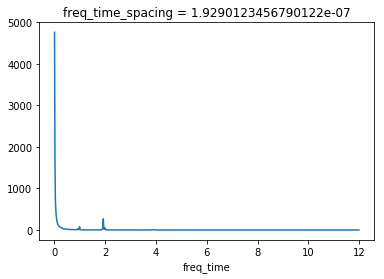

In [33]:
E0_cycl.plot()

In [34]:
E_cycl_open = E0_cycl
E_anti_open = E0_anti

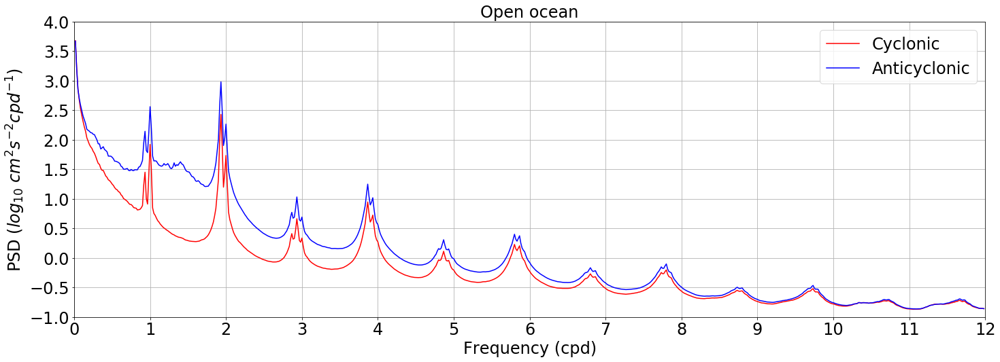

In [35]:
fig, ax = plt.subplots(figsize=(24,8))

labels = ['Cyclonic', 'Anticyclonic']

(np.log10(E_cycl_open).where(E_cycl_open.freq_time>0)).plot(ax=ax,color='red', label=labels[0])
(np.log10(E_anti_open).where(E_anti_open.freq_time>0)).plot(ax=ax,color='blue', label=labels[1])

ax.legend(); ax.grid()

#ax.set_yscale('log')
ax.set_ylim([-1.,4.])
ax.set_yticks([-1., -0.5, 0., 0.5, 1., 1.5, 2., 2.5, 3., 3.5, 4])

ax.set_xlim([0.,12.])
#ax.set_ylim([1e-1,1e4])
ax.set_xticks([0., 1., 2., 3., 4., 5., 6., 7., 8., 9., 10., 11., 12.])

ax.legend(prop={'size': 24})
ax.set_ylabel('PSD ($log_{10}\ cm^2 s^{-2} cpd^{-1})$',fontsize=24)
ax.set_xlabel('Frequency (cpd)',fontsize=24)
ax.tick_params(labelsize=24)
ax.set_title('Open ocean',fontsize=24)

plt.savefig('/home1/datahome/xyu/equinox_working/sandbox/Figures/Globally_averaged_PSD_openocean.png')



#### The world oceans vs open ocean

No handles with labels found to put in legend.
No handles with labels found to put in legend.


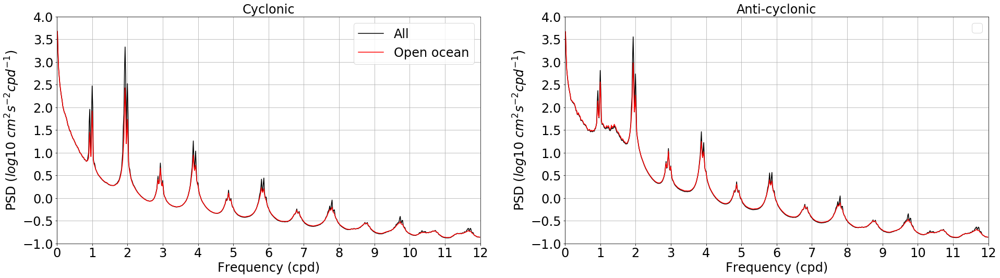

In [69]:

fig = plt.subplots(figsize=(32,8))


ax=plt.subplot(121)


labels = ['All', 'Open ocean']

(np.log10(E_cycl_all).where(E_cycl_all.freq_time>0)).plot(ax=ax,color='black', label=labels[0])
(np.log10(E_cycl_open).where(E_cycl_open.freq_time>0)).plot(ax=ax,color='red', label=labels[1])

ax.legend(); ax.grid()
#ax.set_yscale('log')
ax.set_ylim([-1.,4.])
ax.set_yticks([-1., -0.5, 0., 0.5, 1., 1.5, 2., 2.5, 3., 3.5, 4])
ax.set_xlim([0.,12.])
#ax.set_ylim([1e-1,1e4])
ax.set_xticks([0., 1., 2., 3., 4., 5., 6., 7., 8., 9., 10., 11., 12.])
ax.legend(prop={'size': 24})
ax.set_ylabel('PSD ($log10\ cm^2 s^{-2} cpd^{-1})$',fontsize=24)

ax.set_xlabel('Frequency (cpd)',fontsize=24)
ax.tick_params(labelsize=24)
ax.set_title('Cyclonic',fontsize=24)


ax=plt.subplot(122)

(np.log10(E_anti_all).where(E_anti_all.freq_time>0)).plot(ax=ax,color='black')
(np.log10(E_anti_open).where(E_anti_open.freq_time>0)).plot(ax=ax,color='red')

ax.legend(); ax.grid()
#ax.set_yscale('log')
ax.set_ylim([-1.,4.])
ax.set_yticks([-1., -0.5, 0., 0.5, 1., 1.5, 2., 2.5, 3., 3.5, 4])
ax.set_xlim([0.,12.])
#ax.set_ylim([1e-1,1e4])
ax.set_xticks([0., 1., 2., 3., 4., 5., 6., 7., 8., 9., 10., 11., 12.])
ax.legend(prop={'size': 24})
ax.set_ylabel('PSD ($log10\ cm^2 s^{-2} cpd^{-1})$',fontsize=24)

ax.set_xlabel('Frequency (cpd)',fontsize=24)
ax.tick_params(labelsize=24)
ax.set_title('Anti-cyclonic',fontsize=24)


plt.savefig('/home1/datahome/xyu/equinox_working/sandbox/Figures/Globally_averaged_PSD_comparison.png')



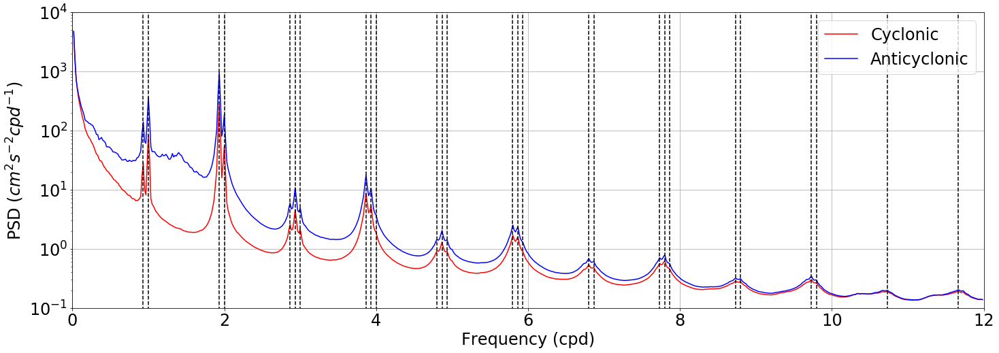

In [37]:

fig, ax = plt.subplots(figsize=(24,8))

labels = ['Cyclonic', 'Anticyclonic']

(E_cycl_open.where(E_cycl_open.freq_time>0)).plot(ax=ax,color='red', label=labels[0])
(E_anti_open.where(E_anti_open.freq_time>0)).plot(ax=ax,color='blue', label=labels[1])

ax.legend(); ax.grid()
ax.set_yscale('log')
#ax.set_ylim([-0.5,4.5])
#ax.set_yticks([-0.5, 0., 0.5, 1., 1.5, 2., 2.5, 3., 3.5, 4., 4.5])

ax.set_xlim([0.,12.])
ax.set_ylim([1e-1,1e4])


#ax.set_xticks([0., 1., 2., 3., 4., 5., 6., 7., 8., 9., 10., 11., 12.])
ax.legend(prop={'size': 24})
ax.set_ylabel('PSD ($cm^2 s^{-2} cpd^{-1})$',fontsize=24)
ax.set_xlabel('Frequency (cpd)',fontsize=24)
ax.tick_params(labelsize=24)
ax.set_title('')

# Diurnal frequencies
ax.plot([24/25.81933871,24/25.81933871],[1e-2,1e6],'k--') # O1
ax.plot([1,1],[1e-2,1e6],'k--') # S1

# Semi-diurnal frequencies
ax.plot([1.93227,1.93227],[1e-2,1e6],'k--') # M2
ax.plot([2,2],[1e-2,1e6],'k--') # S2

# 3
ax.plot([2.86181,2.86181],[1e-2,1e6],'k--') # MO3
ax.plot([2.93501,2.93501],[1e-2,1e6],'k--') # MK3
ax.plot([3.00274,3.00274],[1e-2,1e6],'k--') # SK3

# 4
ax.plot([3.86455,3.86455],[1e-2,1e6],'k--') # M4
ax.plot([3.93227,3.93227],[1e-2,1e6],'k--') # MS4
ax.plot([4,4],[1e-2,1e6],'k--') # S4

# 5
ax.plot([4.79956,4.79956],[1e-2,1e6],'k--') # 3MP5
ax.plot([4.86729,4.86729],[1e-2,1e6],'k--') # 2MK5
ax.plot([4.93501,4.93501],[1e-2,1e6],'k--') # MSK5

# 6
ax.plot([5.79682,5.79682],[1e-2,1e6],'k--') # M6
ax.plot([5.86455,5.86455],[1e-2,1e6],'k--') # 2MS6
ax.plot([5.93227,5.93227],[1e-2,1e6],'k--') # 2SM6

# 7
ax.plot([6.79956,6.79956],[1e-2,1e6],'k--') # 3MK7
ax.plot([6.86729,6.86729],[1e-2,1e6],'k--') # ST17

# 8
ax.plot([7.72909,7.72909],[1e-2,1e6],'k--') # M8
ax.plot([7.8023,7.8023],[1e-2,1e6],'k--')   # 3MK8
ax.plot([7.86455,7.86455],[1e-2,1e6],'k--') # ST23

# 9
ax.plot([8.73183,8.73183],[1e-2,1e6],'k--') # M4MK9
ax.plot([8.79956,8.79956],[1e-2,1e6],'k--') # ST27


# 10
ax.plot([9.72909,9.72909],[1e-2,1e6],'k--') # ST30
ax.plot([9.79682,9.79682],[1e-2,1e6],'k--') # ST32

# 11
ax.plot([10.7318,10.7318],[1e-2,1e6],'k--') # ST33


# 12
ax.plot([11.6614,11.6614],[1e-2,1e6],'k--') # ST34

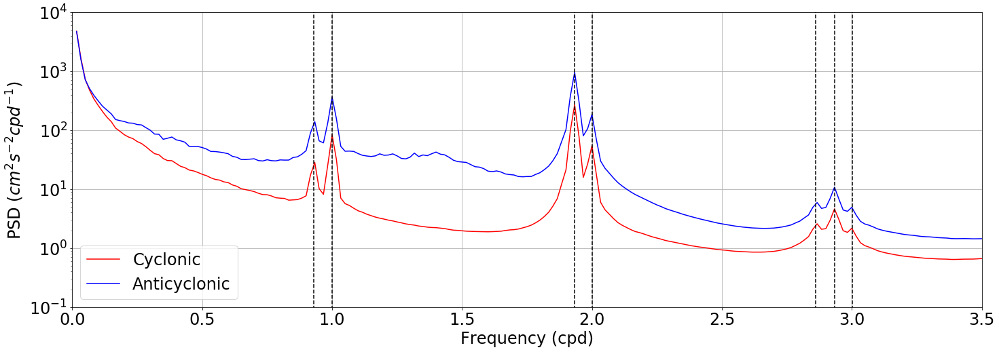

In [38]:

fig, ax = plt.subplots(figsize=(24,8))

labels = ['Cyclonic', 'Anticyclonic']

(E_cycl_open.where(E_cycl_open.freq_time>0)).plot(ax=ax,color='red', label=labels[0])
(E_anti_open.where(E_anti_open.freq_time>0)).plot(ax=ax,color='blue', label=labels[1])

ax.legend(); ax.grid()
ax.set_yscale('log')
#ax.set_ylim([-0.5,4.5])
#ax.set_yticks([-0.5, 0., 0.5, 1., 1.5, 2., 2.5, 3., 3.5, 4., 4.5])

ax.set_xlim([0.,3.5])
ax.set_ylim([1e-1,1e4])


#ax.set_xticks([0., 1., 2., 3., 4., 5., 6., 7., 8., 9., 10., 11., 12.])
ax.legend(prop={'size': 24})
ax.set_ylabel('PSD ($cm^2 s^{-2} cpd^{-1})$',fontsize=24)
ax.set_xlabel('Frequency (cpd)',fontsize=24)
ax.tick_params(labelsize=24)
ax.set_title('')

# Diurnal frequencies
ax.plot([24/25.81933871,24/25.81933871],[1e-2,1e6],'k--') # O1
ax.plot([1,1],[1e-2,1e6],'k--') # S1

# Semi-diurnal frequencies
ax.plot([1.93227,1.93227],[1e-2,1e6],'k--') # M2
ax.plot([2,2],[1e-2,1e6],'k--') # S2

# 3
ax.plot([2.86181,2.86181],[1e-2,1e6],'k--') # MO3
ax.plot([2.93501,2.93501],[1e-2,1e6],'k--') # MK3
ax.plot([3.00274,3.00274],[1e-2,1e6],'k--') # SK3

# 4
ax.plot([3.86455,3.86455],[1e-2,1e6],'k--') # M4
ax.plot([3.93227,3.93227],[1e-2,1e6],'k--') # MS4
ax.plot([4,4],[1e-2,1e6],'k--') # S4

# 5
ax.plot([4.79956,4.79956],[1e-2,1e6],'k--') # 3MP5
ax.plot([4.86729,4.86729],[1e-2,1e6],'k--') # 2MK5
ax.plot([4.93501,4.93501],[1e-2,1e6],'k--') # MSK5

# 6
ax.plot([5.79682,5.79682],[1e-2,1e6],'k--') # M6
ax.plot([5.86455,5.86455],[1e-2,1e6],'k--') # 2MS6
ax.plot([5.93227,5.93227],[1e-2,1e6],'k--') # 2SM6

# 7
ax.plot([6.79956,6.79956],[1e-2,1e6],'k--') # 3MK7
ax.plot([6.86729,6.86729],[1e-2,1e6],'k--') # ST17

# 8
ax.plot([7.72909,7.72909],[1e-2,1e6],'k--') # M8
ax.plot([7.8023,7.8023],[1e-2,1e6],'k--')   # 3MK8
ax.plot([7.86455,7.86455],[1e-2,1e6],'k--') # ST23

# 9
ax.plot([8.73183,8.73183],[1e-2,1e6],'k--') # M4MK9
ax.plot([8.79956,8.79956],[1e-2,1e6],'k--') # ST27


# 10
ax.plot([9.72909,9.72909],[1e-2,1e6],'k--') # ST30
ax.plot([9.79682,9.79682],[1e-2,1e6],'k--') # ST32

# 11
ax.plot([10.7318,10.7318],[1e-2,1e6],'k--') # ST33


# 12
ax.plot([11.6614,11.6614],[1e-2,1e6],'k--') # ST34

#plt.savefig('/home1/datahome/xyu/equinox_working/sandbox/Figures/Globally_averaged_PSD_nowindow_1.png')



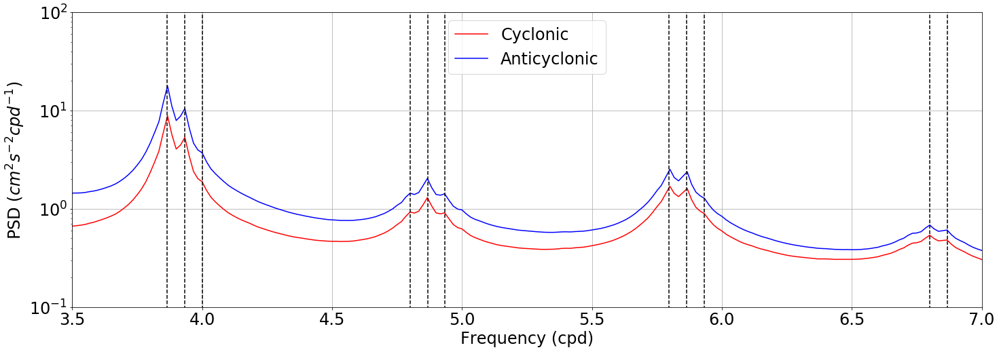

In [39]:

fig, ax = plt.subplots(figsize=(24,8))

labels = ['Cyclonic', 'Anticyclonic']

(E_cycl_open.where(E_cycl_open.freq_time>0)).plot(ax=ax,color='red', label=labels[0])
(E_anti_open.where(E_anti_open.freq_time>0)).plot(ax=ax,color='blue', label=labels[1])

ax.legend(); ax.grid()
ax.set_yscale('log')
#ax.set_ylim([-0.5,4.5])
#ax.set_yticks([-0.5, 0., 0.5, 1., 1.5, 2., 2.5, 3., 3.5, 4., 4.5])

ax.set_xlim([3.5,7.])
ax.set_ylim([1e-1,1e2])


#ax.set_xticks([0., 1., 2., 3., 4., 5., 6., 7., 8., 9., 10., 11., 12.])
ax.legend(prop={'size': 24})
ax.set_ylabel('PSD ($cm^2 s^{-2} cpd^{-1})$',fontsize=24)
ax.set_xlabel('Frequency (cpd)',fontsize=24)
ax.tick_params(labelsize=24)
ax.set_title('')

# Diurnal frequencies
ax.plot([24/25.81933871,24/25.81933871],[1e-2,1e6],'k--') # O1
ax.plot([1,1],[1e-2,1e6],'k--') # S1

# Semi-diurnal frequencies
ax.plot([1.93227,1.93227],[1e-2,1e6],'k--') # M2
ax.plot([2,2],[1e-2,1e6],'k--') # S2

# 3
ax.plot([2.86181,2.86181],[1e-2,1e6],'k--') # MO3
ax.plot([2.93501,2.93501],[1e-2,1e6],'k--') # MK3
ax.plot([3.00274,3.00274],[1e-2,1e6],'k--') # SK3

# 4
ax.plot([3.86455,3.86455],[1e-2,1e6],'k--') # M4
ax.plot([3.93227,3.93227],[1e-2,1e6],'k--') # MS4
ax.plot([4,4],[1e-2,1e6],'k--') # S4

# 5
ax.plot([4.79956,4.79956],[1e-2,1e6],'k--') # 3MP5
ax.plot([4.86729,4.86729],[1e-2,1e6],'k--') # 2MK5
ax.plot([4.93501,4.93501],[1e-2,1e6],'k--') # MSK5

# 6
ax.plot([5.79682,5.79682],[1e-2,1e6],'k--') # M6
ax.plot([5.86455,5.86455],[1e-2,1e6],'k--') # 2MS6
ax.plot([5.93227,5.93227],[1e-2,1e6],'k--') # 2SM6

# 7
ax.plot([6.79956,6.79956],[1e-2,1e6],'k--') # 3MK7
ax.plot([6.86729,6.86729],[1e-2,1e6],'k--') # ST17

# 8
ax.plot([7.72909,7.72909],[1e-2,1e6],'k--') # M8
ax.plot([7.8023,7.8023],[1e-2,1e6],'k--')   # 3MK8
ax.plot([7.86455,7.86455],[1e-2,1e6],'k--') # ST23

# 9
ax.plot([8.73183,8.73183],[1e-2,1e6],'k--') # M4MK9
ax.plot([8.79956,8.79956],[1e-2,1e6],'k--') # ST27


# 10
ax.plot([9.72909,9.72909],[1e-2,1e6],'k--') # ST30
ax.plot([9.79682,9.79682],[1e-2,1e6],'k--') # ST32

# 11
ax.plot([10.7318,10.7318],[1e-2,1e6],'k--') # ST33


# 12
ax.plot([11.6614,11.6614],[1e-2,1e6],'k--') # ST34

#plt.savefig('/home1/datahome/xyu/equinox_working/sandbox/Figures/Globally_averaged_PSD_nowindow_2.png')



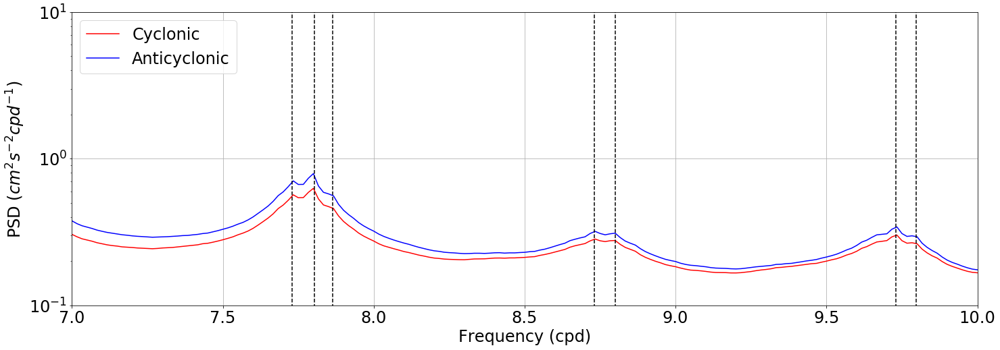

In [40]:

fig, ax = plt.subplots(figsize=(24,8))

labels = ['Cyclonic', 'Anticyclonic']

(E_cycl_open.where(E_cycl_open.freq_time>0)).plot(ax=ax,color='red', label=labels[0])
(E_anti_open.where(E_anti_open.freq_time>0)).plot(ax=ax,color='blue', label=labels[1])

ax.legend(); ax.grid()
ax.set_yscale('log')
#ax.set_ylim([-0.5,4.5])
#ax.set_yticks([-0.5, 0., 0.5, 1., 1.5, 2., 2.5, 3., 3.5, 4., 4.5])

ax.set_xlim([7.,10.])
ax.set_ylim([1e-1,1e1])


#ax.set_xticks([0., 1., 2., 3., 4., 5., 6., 7., 8., 9., 10., 11., 12.])
ax.legend(prop={'size': 24})
ax.set_ylabel('PSD ($cm^2 s^{-2} cpd^{-1})$',fontsize=24)
ax.set_xlabel('Frequency (cpd)',fontsize=24)
ax.tick_params(labelsize=24)
ax.set_title('')

# Diurnal frequencies
ax.plot([24/25.81933871,24/25.81933871],[1e-2,1e6],'k--') # O1
ax.plot([1,1],[1e-2,1e6],'k--') # S1

# Semi-diurnal frequencies
ax.plot([1.93227,1.93227],[1e-2,1e6],'k--') # M2
ax.plot([2,2],[1e-2,1e6],'k--') # S2

# 3
ax.plot([2.86181,2.86181],[1e-2,1e6],'k--') # MO3
ax.plot([2.93501,2.93501],[1e-2,1e6],'k--') # MK3
ax.plot([3.00274,3.00274],[1e-2,1e6],'k--') # SK3

# 4
ax.plot([3.86455,3.86455],[1e-2,1e6],'k--') # M4
ax.plot([3.93227,3.93227],[1e-2,1e6],'k--') # MS4
ax.plot([4,4],[1e-2,1e6],'k--') # S4

# 5
ax.plot([4.79956,4.79956],[1e-2,1e6],'k--') # 3MP5
ax.plot([4.86729,4.86729],[1e-2,1e6],'k--') # 2MK5
ax.plot([4.93501,4.93501],[1e-2,1e6],'k--') # MSK5

# 6
ax.plot([5.79682,5.79682],[1e-2,1e6],'k--') # M6
ax.plot([5.86455,5.86455],[1e-2,1e6],'k--') # 2MS6
ax.plot([5.93227,5.93227],[1e-2,1e6],'k--') # 2SM6

# 7
ax.plot([6.79956,6.79956],[1e-2,1e6],'k--') # 3MK7
ax.plot([6.86729,6.86729],[1e-2,1e6],'k--') # ST17

# 8
ax.plot([7.72909,7.72909],[1e-2,1e6],'k--') # M8
ax.plot([7.8023,7.8023],[1e-2,1e6],'k--')   # 3MK8
ax.plot([7.86455,7.86455],[1e-2,1e6],'k--') # ST23

# 9
ax.plot([8.73183,8.73183],[1e-2,1e6],'k--') # M4MK9
ax.plot([8.79956,8.79956],[1e-2,1e6],'k--') # ST27


# 10
ax.plot([9.72909,9.72909],[1e-2,1e6],'k--') # ST30
ax.plot([9.79682,9.79682],[1e-2,1e6],'k--') # ST32

# 11
ax.plot([10.7318,10.7318],[1e-2,1e6],'k--') # ST33


# 12
ax.plot([11.6614,11.6614],[1e-2,1e6],'k--') # ST34

#plt.savefig('/home1/datahome/xyu/equinox_working/sandbox/Figures/Globally_averaged_PSD_nowindow_3.png')



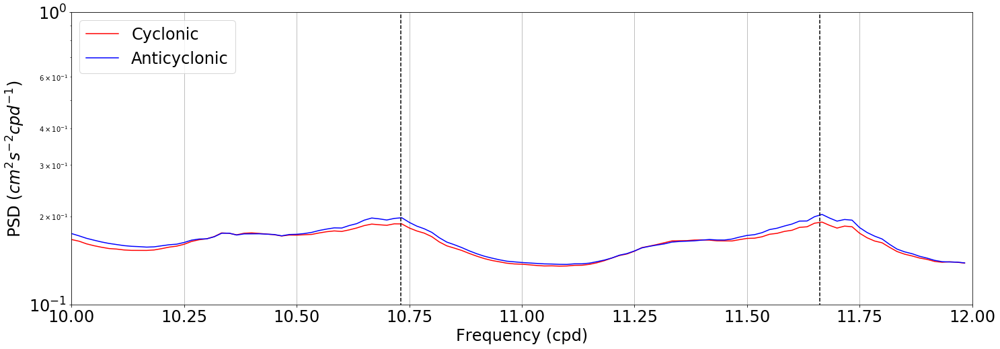

In [41]:

fig, ax = plt.subplots(figsize=(24,8))

labels = ['Cyclonic', 'Anticyclonic']


(E_cycl_open.where(E_cycl_open.freq_time>0)).plot(ax=ax,color='red', label=labels[0])
(E_anti_open.where(E_anti_open.freq_time>0)).plot(ax=ax,color='blue', label=labels[1])

ax.legend(); ax.grid()
ax.set_yscale('log')
#ax.set_ylim([-0.5,4.5])
#ax.set_yticks([-0.5, 0., 0.5, 1., 1.5, 2., 2.5, 3., 3.5, 4., 4.5])

ax.set_xlim([10.,12.])
ax.set_ylim([1e-1,1e0])


#ax.set_xticks([0., 1., 2., 3., 4., 5., 6., 7., 8., 9., 10., 11., 12.])
ax.legend(prop={'size': 24})
ax.set_ylabel('PSD ($cm^2 s^{-2} cpd^{-1})$',fontsize=24)
ax.set_xlabel('Frequency (cpd)',fontsize=24)
ax.tick_params(labelsize=24)
ax.set_title('')

# Diurnal frequencies
ax.plot([24/25.81933871,24/25.81933871],[1e-2,1e6],'k--') # O1
ax.plot([1,1],[1e-2,1e6],'k--') # S1

# Semi-diurnal frequencies
ax.plot([1.93227,1.93227],[1e-2,1e6],'k--') # M2
ax.plot([2,2],[1e-2,1e6],'k--') # S2

# 3
ax.plot([2.86181,2.86181],[1e-2,1e6],'k--') # MO3
ax.plot([2.93501,2.93501],[1e-2,1e6],'k--') # MK3
ax.plot([3.00274,3.00274],[1e-2,1e6],'k--') # SK3

# 4
ax.plot([3.86455,3.86455],[1e-2,1e6],'k--') # M4
ax.plot([3.93227,3.93227],[1e-2,1e6],'k--') # MS4
ax.plot([4,4],[1e-2,1e6],'k--') # S4

# 5
ax.plot([4.79956,4.79956],[1e-2,1e6],'k--') # 3MP5
ax.plot([4.86729,4.86729],[1e-2,1e6],'k--') # 2MK5
ax.plot([4.93501,4.93501],[1e-2,1e6],'k--') # MSK5

# 6
ax.plot([5.79682,5.79682],[1e-2,1e6],'k--') # M6
ax.plot([5.86455,5.86455],[1e-2,1e6],'k--') # 2MS6
ax.plot([5.93227,5.93227],[1e-2,1e6],'k--') # 2SM6

# 7
ax.plot([6.79956,6.79956],[1e-2,1e6],'k--') # 3MK7
ax.plot([6.86729,6.86729],[1e-2,1e6],'k--') # ST17

# 8
ax.plot([7.72909,7.72909],[1e-2,1e6],'k--') # M8
ax.plot([7.8023,7.8023],[1e-2,1e6],'k--')   # 3MK8
ax.plot([7.86455,7.86455],[1e-2,1e6],'k--') # ST23

# 9
ax.plot([8.73183,8.73183],[1e-2,1e6],'k--') # M4MK9
ax.plot([8.79956,8.79956],[1e-2,1e6],'k--') # ST27


# 10
ax.plot([9.72909,9.72909],[1e-2,1e6],'k--') # ST30
ax.plot([9.79682,9.79682],[1e-2,1e6],'k--') # ST32

# 11
ax.plot([10.7318,10.7318],[1e-2,1e6],'k--') # ST33


# 12
ax.plot([11.6614,11.6614],[1e-2,1e6],'k--') # ST34

#plt.savefig('/home1/datahome/xyu/equinox_working/sandbox/Figures/Globally_averaged_PSD_nowindow_4.png')



## 3.4 Read results and plot figures_coastal oceans

In [42]:
face =1 

filenames_u = sorted(glob(E_dir+'E_uv_south_allmean_coastalocean.nc'))

# Grid #
grid = mgrid.isel(face=face)
# Read SSU #
ds = xr.open_mfdataset(filenames_u)
print(ds)

<xarray.Dataset>
Dimensions:                        (freq_time: 1440)
Coordinates:
  * freq_time                      (freq_time) float64 0.0 1.929e-07 ...
    freq_time_spacing              float64 ...
Data variables:
    __xarray_dataarray_variable__  (freq_time) float64 dask.array<shape=(1440,), chunksize=(1440,)>


In [43]:
E_south = ds.__xarray_dataarray_variable__
E_south = E_south.assign_coords(freq_time=ds.__xarray_dataarray_variable__.freq_time * 86400.) 
print(E_south)

<xarray.DataArray '__xarray_dataarray_variable__' (freq_time: 1440)>
dask.array<shape=(1440,), dtype=float64, chunksize=(1440,)>
Coordinates:
  * freq_time          (freq_time) float64 0.0 0.01667 0.03333 0.05 0.06667 ...
    freq_time_spacing  float64 ...


In [44]:
E0_south = E_south/8.64

In [45]:
#filenames_u = sorted(glob(E_dir+'E_uv_allface_mean.nc'))
filenames_u = sorted(glob(E_dir+'E_uv_north_allmean_coastalocean.nc'))

# Grid #
grid = mgrid.isel(face=face)
# Read SSU #
ds0 = xr.open_mfdataset(filenames_u)
print(ds0)

<xarray.Dataset>
Dimensions:                        (freq_time: 1440)
Coordinates:
  * freq_time                      (freq_time) float64 0.0 1.929e-07 ...
    freq_time_spacing              float64 ...
Data variables:
    __xarray_dataarray_variable__  (freq_time) float64 dask.array<shape=(1440,), chunksize=(1440,)>


In [46]:
E_north = ds0.__xarray_dataarray_variable__
E_north = E_north.assign_coords(freq_time=ds0.__xarray_dataarray_variable__.freq_time * 86400.) 
print(E_north)

<xarray.DataArray '__xarray_dataarray_variable__' (freq_time: 1440)>
dask.array<shape=(1440,), dtype=float64, chunksize=(1440,)>
Coordinates:
  * freq_time          (freq_time) float64 0.0 0.01667 0.03333 0.05 0.06667 ...
    freq_time_spacing  float64 ...


In [47]:
E0_north = E_north/8.64

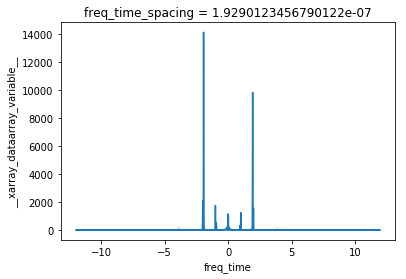

In [48]:
E0_north.plot()

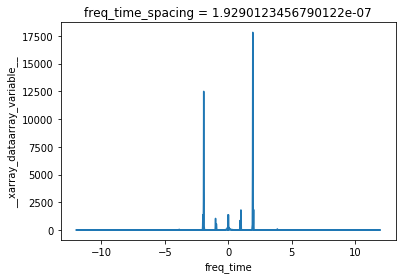

In [49]:
E0_south.plot()

In [50]:
E0_south_anti = E0_south.where(E0_south.freq_time>0)
print(E0_south_anti)

E0_north_anti = E0_north.where(E0_north.freq_time<0)
E0_north_anti = E0_north_anti.assign_coords(freq_time=E_north.freq_time * -1.) 
print(E0_north_anti)

<xarray.DataArray (freq_time: 1440)>
dask.array<shape=(1440,), dtype=float64, chunksize=(1440,)>
Coordinates:
  * freq_time          (freq_time) float64 0.0 0.01667 0.03333 0.05 0.06667 ...
    freq_time_spacing  float64 1.929e-07
<xarray.DataArray (freq_time: 1440)>
dask.array<shape=(1440,), dtype=float64, chunksize=(1440,)>
Coordinates:
  * freq_time          (freq_time) float64 -0.0 -0.01667 -0.03333 -0.05 ...
    freq_time_spacing  float64 ...


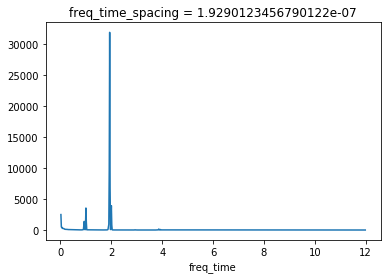

In [51]:
E0_anti = E0_north_anti + E0_south_anti
E0_anti.plot()

In [52]:
E0_south_cycl = E0_south.where(E0_south.freq_time<0)
print(E0_south_cycl)

E0_north_cycl = E0_north.where(E0_north.freq_time>0)
E0_north_cycl = E0_north_cycl.assign_coords(freq_time=E_north.freq_time * -1.) 
print(E0_north_cycl)

<xarray.DataArray (freq_time: 1440)>
dask.array<shape=(1440,), dtype=float64, chunksize=(1440,)>
Coordinates:
  * freq_time          (freq_time) float64 0.0 0.01667 0.03333 0.05 0.06667 ...
    freq_time_spacing  float64 1.929e-07
<xarray.DataArray (freq_time: 1440)>
dask.array<shape=(1440,), dtype=float64, chunksize=(1440,)>
Coordinates:
  * freq_time          (freq_time) float64 -0.0 -0.01667 -0.03333 -0.05 ...
    freq_time_spacing  float64 ...


In [53]:
E0_cycl = E0_north_cycl + E0_south_cycl
E0_cycl = E0_cycl.assign_coords(freq_time=E0_cycl.freq_time * -1.) 

print(E0_cycl)

<xarray.DataArray (freq_time: 1439)>
dask.array<shape=(1439,), dtype=float64, chunksize=(1439,)>
Coordinates:
  * freq_time          (freq_time) float64 -0.0 0.01667 0.03333 0.05 0.06667 ...
    freq_time_spacing  float64 1.929e-07


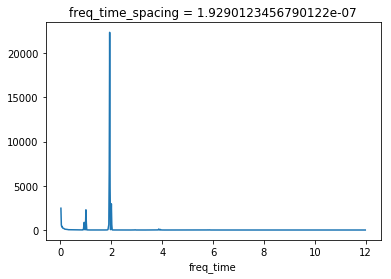

In [54]:
E0_cycl.plot()

In [55]:
E_cycl_coastal = E0_cycl
E_anti_coastal = E0_anti

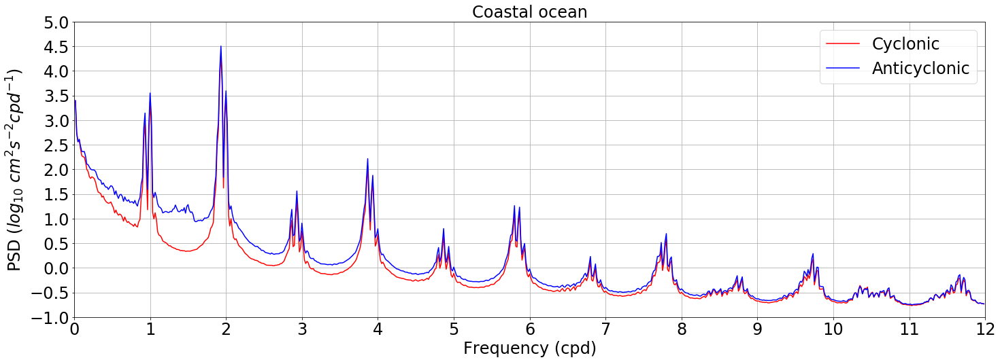

In [56]:
fig, ax = plt.subplots(figsize=(24,8))

labels = ['Cyclonic', 'Anticyclonic']

(np.log10(E_cycl_coastal).where(E_cycl_coastal.freq_time>0)).plot(ax=ax,color='red', label=labels[0])
(np.log10(E_anti_coastal).where(E_anti_coastal.freq_time>0)).plot(ax=ax,color='blue', label=labels[1])

ax.legend(); ax.grid()

#ax.set_yscale('log')
ax.set_ylim([-1.,5.])
ax.set_yticks([-1., -0.5, 0., 0.5, 1., 1.5, 2., 2.5, 3., 3.5, 4., 4.5, 5])

ax.set_xlim([0.,12.])
#ax.set_ylim([1e-1,1e4])
ax.set_xticks([0., 1., 2., 3., 4., 5., 6., 7., 8., 9., 10., 11., 12.])

ax.legend(prop={'size': 24})
ax.set_ylabel('PSD ($log_{10}\ cm^2 s^{-2} cpd^{-1})$',fontsize=24)
ax.set_xlabel('Frequency (cpd)',fontsize=24)
ax.tick_params(labelsize=24)
ax.set_title('Coastal ocean',fontsize=24)

plt.savefig('/home1/datahome/xyu/equinox_working/sandbox/Figures/Globally_averaged_PSD_coastalocean.png')



No handles with labels found to put in legend.
No handles with labels found to put in legend.


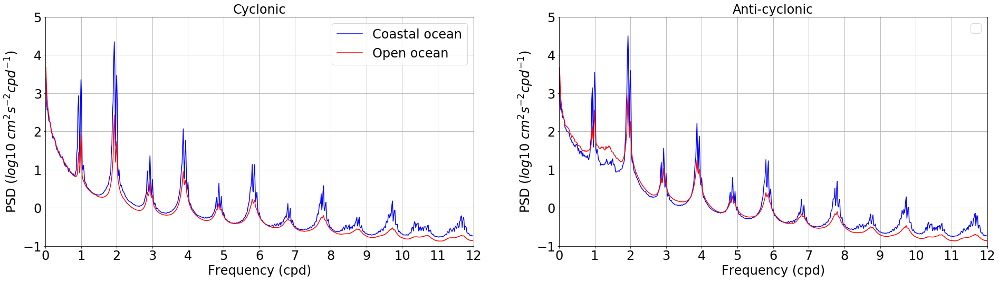

In [68]:

fig = plt.subplots(figsize=(32,8))


ax=plt.subplot(121)


labels = ['Coastal ocean', 'Open ocean']

(np.log10(E_cycl_coastal).where(E_cycl_coastal.freq_time>0)).plot(ax=ax,color='blue', label=labels[0])
(np.log10(E_cycl_open).where(E_cycl_open.freq_time>0)).plot(ax=ax,color='red', label=labels[1])

ax.legend(); ax.grid()
#ax.set_yscale('log')
ax.set_ylim([-1.,5.])
ax.set_yticks([-1., 0., 1., 2., 3., 4, 5])
ax.set_xlim([0.,12.])
#ax.set_ylim([1e-1,1e4])
ax.set_xticks([0., 1., 2., 3., 4., 5., 6., 7., 8., 9., 10., 11., 12.])
ax.legend(prop={'size': 24})
ax.set_ylabel('PSD ($log10\ cm^2 s^{-2} cpd^{-1})$',fontsize=24)

ax.set_xlabel('Frequency (cpd)',fontsize=24)
ax.tick_params(labelsize=24)
ax.set_title('Cyclonic',fontsize=24)


ax=plt.subplot(122)

(np.log10(E_anti_coastal).where(E_anti_coastal.freq_time>0)).plot(ax=ax,color='blue')
(np.log10(E_anti_open).where(E_anti_open.freq_time>0)).plot(ax=ax,color='red')

ax.legend(); ax.grid()
#ax.set_yscale('log')
ax.set_ylim([-1.,5.])
ax.set_yticks([-1., 0., 1., 2., 3., 4, 5])
ax.set_xlim([0.,12.])
#ax.set_ylim([1e-1,1e4])
ax.set_xticks([0., 1., 2., 3., 4., 5., 6., 7., 8., 9., 10., 11., 12.])
ax.legend(prop={'size': 24})
ax.set_ylabel('PSD ($log10\ cm^2 s^{-2} cpd^{-1})$',fontsize=24)

ax.set_xlabel('Frequency (cpd)',fontsize=24)
ax.tick_params(labelsize=24)
ax.set_title('Anti-cyclonic',fontsize=24)


plt.savefig('/home1/datahome/xyu/equinox_working/sandbox/Figures/Globally_averaged_PSD_coastal_open_comparison.png')



No handles with labels found to put in legend.
No handles with labels found to put in legend.


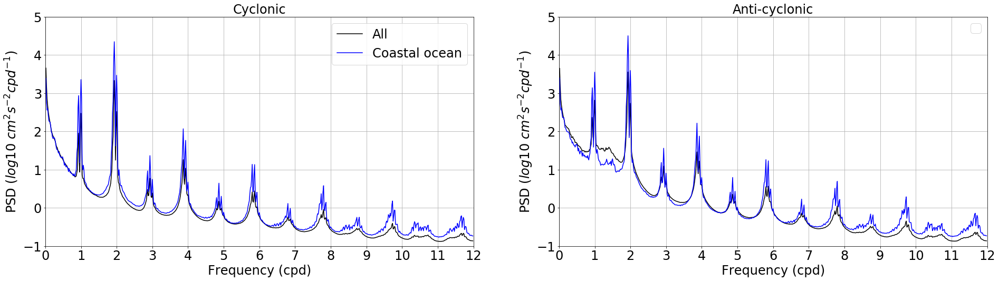

In [67]:

fig = plt.subplots(figsize=(32,8))


ax=plt.subplot(121)


labels = ['All', 'Coastal ocean']

(np.log10(E_cycl_all).where(E_cycl_all.freq_time>0)).plot(ax=ax,color='black', label=labels[0])
(np.log10(E_cycl_coastal).where(E_cycl_coastal.freq_time>0)).plot(ax=ax,color='blue', label=labels[1])

ax.legend(); ax.grid()
#ax.set_yscale('log')
ax.set_ylim([-1.,5.])
ax.set_yticks([-1., 0., 1., 2., 3., 4, 5])
ax.set_xlim([0.,12.])
#ax.set_ylim([1e-1,1e4])
ax.set_xticks([0., 1., 2., 3., 4., 5., 6., 7., 8., 9., 10., 11., 12.])
ax.legend(prop={'size': 24})
ax.set_ylabel('PSD ($log10\ cm^2 s^{-2} cpd^{-1})$',fontsize=24)

ax.set_xlabel('Frequency (cpd)',fontsize=24)
ax.tick_params(labelsize=24)
ax.set_title('Cyclonic',fontsize=24)


ax=plt.subplot(122)

(np.log10(E_anti_all).where(E_anti_all.freq_time>0)).plot(ax=ax,color='black')
(np.log10(E_anti_coastal).where(E_anti_coastal.freq_time>0)).plot(ax=ax,color='blue')

ax.legend(); ax.grid()
#ax.set_yscale('log')
ax.set_ylim([-1.,5.])
ax.set_yticks([-1., 0., 1., 2., 3., 4, 5])
ax.set_xlim([0.,12.])
#ax.set_ylim([1e-1,1e4])
ax.set_xticks([0., 1., 2., 3., 4., 5., 6., 7., 8., 9., 10., 11., 12.])
ax.legend(prop={'size': 24})
ax.set_ylabel('PSD ($log10\ cm^2 s^{-2} cpd^{-1})$',fontsize=24)

ax.set_xlabel('Frequency (cpd)',fontsize=24)
ax.tick_params(labelsize=24)
ax.set_title('Anti-cyclonic',fontsize=24)


plt.savefig('/home1/datahome/xyu/equinox_working/sandbox/Figures/Globally_averaged_PSD_coastal_all_comparison.png')

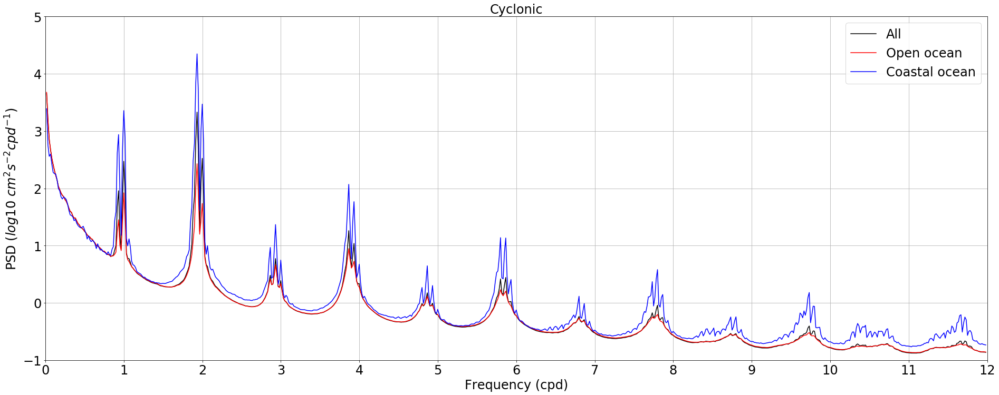

In [66]:

fig = plt.subplots(figsize=(32,12))


ax=plt.subplot(111)


labels = ['All', 'Open ocean', 'Coastal ocean']

(np.log10(E_cycl_all).where(E_cycl_all.freq_time>0)).plot(ax=ax,color='black', label=labels[0])
(np.log10(E_cycl_open).where(E_cycl_open.freq_time>0)).plot(ax=ax,color='red', label=labels[1])
(np.log10(E_cycl_coastal).where(E_cycl_coastal.freq_time>0)).plot(ax=ax,color='blue', label=labels[2])

ax.legend(); ax.grid()
#ax.set_yscale('log')
ax.set_ylim([-1.,5.])
ax.set_yticks([-1., 0., 1., 2., 3., 4, 5])
ax.set_xlim([0.,12.])
#ax.set_ylim([1e-1,1e4])
ax.set_xticks([0., 1., 2., 3., 4., 5., 6., 7., 8., 9., 10., 11., 12.])
ax.legend(prop={'size': 24})
ax.set_ylabel('PSD ($log10\ cm^2 s^{-2} cpd^{-1})$',fontsize=24)
ax.set_xlabel('Frequency (cpd)',fontsize=24)
ax.tick_params(labelsize=24)
ax.set_title('Cyclonic',fontsize=24)

plt.savefig('/home1/datahome/xyu/equinox_working/sandbox/Figures/Globally_averaged_PSD_coastal_open_all_comparison_1.png')

No handles with labels found to put in legend.
No handles with labels found to put in legend.


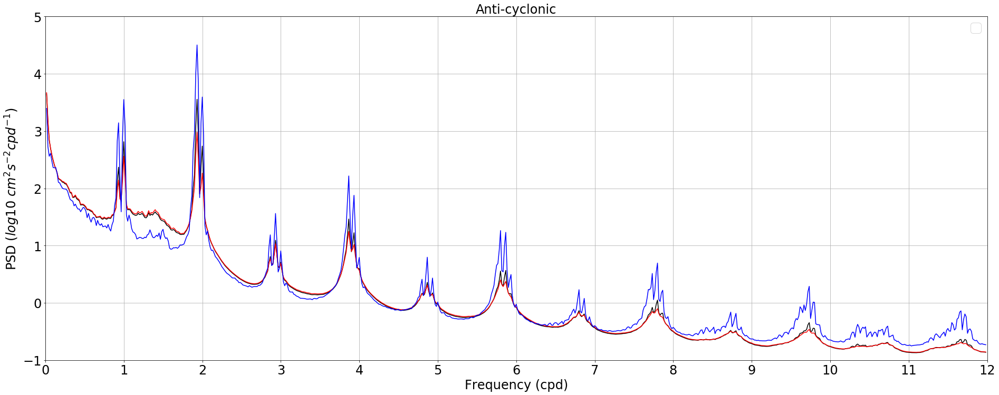

In [65]:

fig = plt.subplots(figsize=(32,12))



ax=plt.subplot(111)

(np.log10(E_anti_all).where(E_anti_all.freq_time>0)).plot(ax=ax,color='black')
(np.log10(E_anti_open).where(E_anti_open.freq_time>0)).plot(ax=ax,color='red')
(np.log10(E_anti_coastal).where(E_anti_coastal.freq_time>0)).plot(ax=ax,color='blue')

ax.legend(); ax.grid()
#ax.set_yscale('log')
ax.set_ylim([-1.,5.])
ax.set_yticks([-1., 0., 1., 2., 3., 4, 5])
ax.set_xlim([0.,12.])
#ax.set_ylim([1e-1,1e4])
ax.set_xticks([0., 1., 2., 3., 4., 5., 6., 7., 8., 9., 10., 11., 12.])
ax.legend(prop={'size': 24})
ax.set_ylabel('PSD ($log10\ cm^2 s^{-2} cpd^{-1})$',fontsize=24)
ax.set_xlabel('Frequency (cpd)',fontsize=24)
ax.tick_params(labelsize=24)
ax.set_title('Anti-cyclonic',fontsize=24)


plt.savefig('/home1/datahome/xyu/equinox_working/sandbox/Figures/Globally_averaged_PSD_coastal_open_all_comparison_2.png')

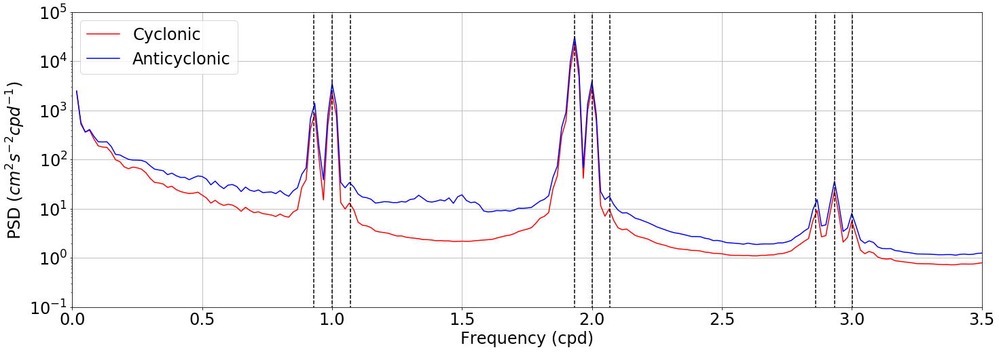

In [78]:

fig, ax = plt.subplots(figsize=(24,8))

labels = ['Cyclonic', 'Anticyclonic']

(E_cycl_coastal.where(E_cycl_coastal.freq_time>0)).plot(ax=ax,color='red', label=labels[0])
(E_anti_coastal.where(E_anti_coastal.freq_time>0)).plot(ax=ax,color='blue', label=labels[1])

ax.legend(); ax.grid()
ax.set_yscale('log')
#ax.set_ylim([-0.5,4.5])
#ax.set_yticks([-0.5, 0., 0.5, 1., 1.5, 2., 2.5, 3., 3.5, 4., 4.5])

ax.set_xlim([0.,3.5])
ax.set_ylim([1e-1,1e5])


#ax.set_xticks([0., 1., 2., 3., 4., 5., 6., 7., 8., 9., 10., 11., 12.])
ax.legend(prop={'size': 24})
ax.set_ylabel('PSD ($cm^2 s^{-2} cpd^{-1})$',fontsize=24)
ax.set_xlabel('Frequency (cpd)',fontsize=24)
ax.tick_params(labelsize=24)
ax.set_title('')

# Diurnal frequencies
ax.plot([24/25.81933871,24/25.81933871],[1e-2,1e6],'k--') # O1
ax.plot([1,1],[1e-2,1e6],'k--') # S1
ax.plot([1.07046,1.07046],[1e-2,1e6],'k--') # SO1

# Semi-diurnal frequencies
ax.plot([1.93227,1.93227],[1e-2,1e6],'k--') # M2
ax.plot([2,2],[1e-2,1e6],'k--') # S2
ax.plot([2.06773,2.06773],[1e-2,1e6],'k--') # 2SM2




# 3
ax.plot([2.86181,2.86181],[1e-2,1e6],'k--') # MO3
ax.plot([2.93501,2.93501],[1e-2,1e6],'k--') # MK3
ax.plot([3.00274,3.00274],[1e-2,1e6],'k--') # SK3

# 4
ax.plot([3.86455,3.86455],[1e-2,1e6],'k--') # M4
ax.plot([3.93227,3.93227],[1e-2,1e6],'k--') # MS4
ax.plot([4,4],[1e-2,1e6],'k--') # S4


#plt.savefig('/home1/datahome/xyu/equinox_working/sandbox/Figures/Globally_averaged_PSD_nowindow_1.png')



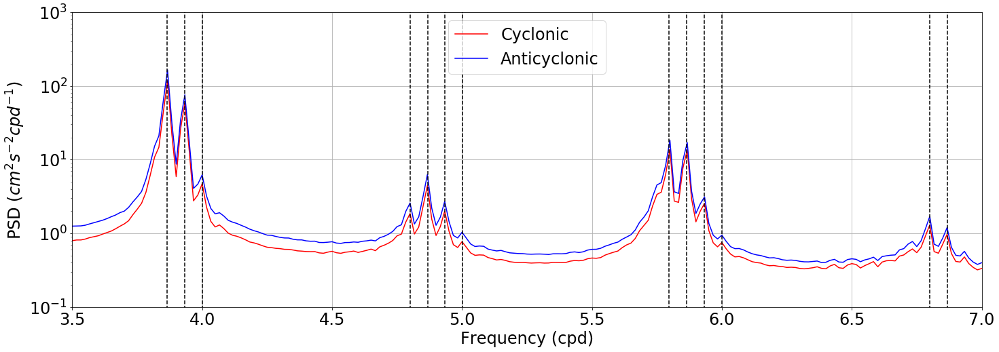

In [80]:

fig, ax = plt.subplots(figsize=(24,8))

labels = ['Cyclonic', 'Anticyclonic']

(E_cycl_coastal.where(E_cycl_coastal.freq_time>0)).plot(ax=ax,color='red', label=labels[0])
(E_anti_coastal.where(E_anti_coastal.freq_time>0)).plot(ax=ax,color='blue', label=labels[1])

ax.legend(); ax.grid()
ax.set_yscale('log')
#ax.set_ylim([-0.5,4.5])
#ax.set_yticks([-0.5, 0., 0.5, 1., 1.5, 2., 2.5, 3., 3.5, 4., 4.5])

ax.set_xlim([3.5,7.])
ax.set_ylim([1e-1,1e3])


#ax.set_xticks([0., 1., 2., 3., 4., 5., 6., 7., 8., 9., 10., 11., 12.])
ax.legend(prop={'size': 24})
ax.set_ylabel('PSD ($cm^2 s^{-2} cpd^{-1})$',fontsize=24)
ax.set_xlabel('Frequency (cpd)',fontsize=24)
ax.tick_params(labelsize=24)
ax.set_title('')

# 4
ax.plot([3.86455,3.86455],[1e-2,1e6],'k--') # M4
ax.plot([3.93227,3.93227],[1e-2,1e6],'k--') # MS4
ax.plot([4,4],[1e-2,1e6],'k--') # S4

# 5
ax.plot([4.79956,4.79956],[1e-2,1e6],'k--') # 3MP5
ax.plot([4.86729,4.86729],[1e-2,1e6],'k--') # 2MK5
ax.plot([4.93501,4.93501],[1e-2,1e6],'k--') # MSK5
ax.plot([5.00274,5.00274],[1e-2,1e6],'k--') # 2SK5

# 6
ax.plot([5.79682,5.79682],[1e-2,1e6],'k--') # M6
ax.plot([5.86455,5.86455],[1e-2,1e6],'k--') # 2MS6
ax.plot([5.93227,5.93227],[1e-2,1e6],'k--') # 2SM6
ax.plot([6,6],[1e-2,1e6],'k--') # S6

# 7
ax.plot([6.79956,6.79956],[1e-2,1e6],'k--') # 3MK7
ax.plot([6.86729,6.86729],[1e-2,1e6],'k--') # ST17



#plt.savefig('/home1/datahome/xyu/equinox_working/sandbox/Figures/Globally_averaged_PSD_nowindow_2.png')



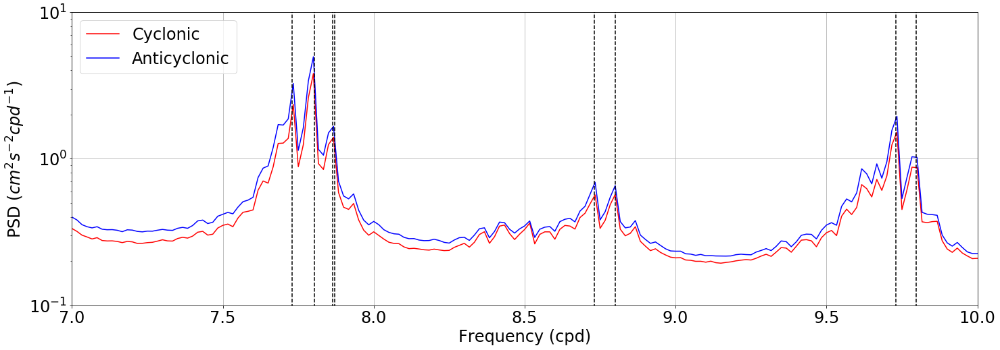

In [81]:

fig, ax = plt.subplots(figsize=(24,8))

labels = ['Cyclonic', 'Anticyclonic']

(E_cycl_coastal.where(E_cycl_coastal.freq_time>0)).plot(ax=ax,color='red', label=labels[0])
(E_anti_coastal.where(E_anti_coastal.freq_time>0)).plot(ax=ax,color='blue', label=labels[1])

ax.legend(); ax.grid()
ax.set_yscale('log')
#ax.set_ylim([-0.5,4.5])
#ax.set_yticks([-0.5, 0., 0.5, 1., 1.5, 2., 2.5, 3., 3.5, 4., 4.5])

ax.set_xlim([7.,10.])
ax.set_ylim([1e-1,1e1])


#ax.set_xticks([0., 1., 2., 3., 4., 5., 6., 7., 8., 9., 10., 11., 12.])
ax.legend(prop={'size': 24})
ax.set_ylabel('PSD ($cm^2 s^{-2} cpd^{-1})$',fontsize=24)
ax.set_xlabel('Frequency (cpd)',fontsize=24)
ax.tick_params(labelsize=24)
ax.set_title('')


# 8
ax.plot([7.72909,7.72909],[1e-2,1e6],'k--') # M8
ax.plot([7.8023,7.8023],[1e-2,1e6],'k--')   # 3MK8
ax.plot([7.86455,7.86455],[1e-2,1e6],'k--') # ST23


# 9
ax.plot([8.73183,8.73183],[1e-2,1e6],'k--') # M4MK9
ax.plot([8.79956,8.79956],[1e-2,1e6],'k--') # ST27


# 10
ax.plot([9.72909,9.72909],[1e-2,1e6],'k--') # ST30
ax.plot([9.79682,9.79682],[1e-2,1e6],'k--') # ST32

# 11
ax.plot([10.7318,10.7318],[1e-2,1e6],'k--') # ST33


# 12
ax.plot([11.6614,11.6614],[1e-2,1e6],'k--') # ST34

#plt.savefig('/home1/datahome/xyu/equinox_working/sandbox/Figures/Globally_averaged_PSD_nowindow_3.png')



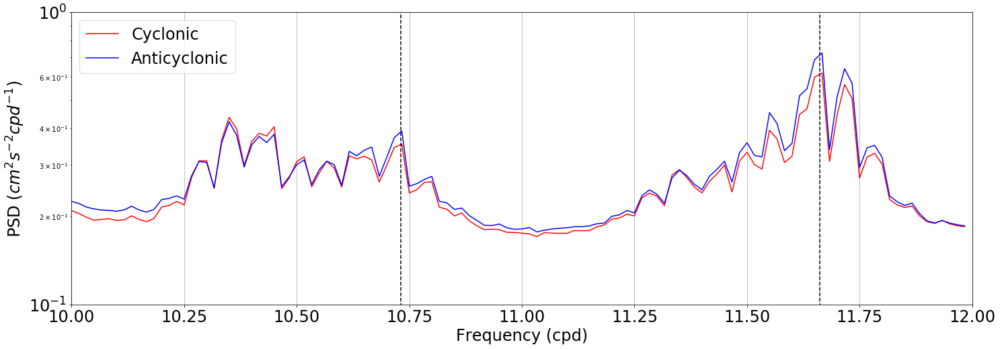

In [75]:

fig, ax = plt.subplots(figsize=(24,8))

labels = ['Cyclonic', 'Anticyclonic']


(E_cycl_coastal.where(E_cycl_coastal.freq_time>0)).plot(ax=ax,color='red', label=labels[0])
(E_anti_coastal.where(E_anti_coastal.freq_time>0)).plot(ax=ax,color='blue', label=labels[1])

ax.legend(); ax.grid()
ax.set_yscale('log')
#ax.set_ylim([-0.5,4.5])
#ax.set_yticks([-0.5, 0., 0.5, 1., 1.5, 2., 2.5, 3., 3.5, 4., 4.5])

ax.set_xlim([10.,12.])
ax.set_ylim([1e-1,1e0])


#ax.set_xticks([0., 1., 2., 3., 4., 5., 6., 7., 8., 9., 10., 11., 12.])
ax.legend(prop={'size': 24})
ax.set_ylabel('PSD ($cm^2 s^{-2} cpd^{-1})$',fontsize=24)
ax.set_xlabel('Frequency (cpd)',fontsize=24)
ax.tick_params(labelsize=24)
ax.set_title('')

# Diurnal frequencies
ax.plot([24/25.81933871,24/25.81933871],[1e-2,1e6],'k--') # O1
ax.plot([1,1],[1e-2,1e6],'k--') # S1

# Semi-diurnal frequencies
ax.plot([1.93227,1.93227],[1e-2,1e6],'k--') # M2
ax.plot([2,2],[1e-2,1e6],'k--') # S2

# 3
ax.plot([2.86181,2.86181],[1e-2,1e6],'k--') # MO3
ax.plot([2.93501,2.93501],[1e-2,1e6],'k--') # MK3
ax.plot([3.00274,3.00274],[1e-2,1e6],'k--') # SK3

# 4
ax.plot([3.86455,3.86455],[1e-2,1e6],'k--') # M4
ax.plot([3.93227,3.93227],[1e-2,1e6],'k--') # MS4
ax.plot([4,4],[1e-2,1e6],'k--') # S4

# 5
ax.plot([4.79956,4.79956],[1e-2,1e6],'k--') # 3MP5
ax.plot([4.86729,4.86729],[1e-2,1e6],'k--') # 2MK5
ax.plot([4.93501,4.93501],[1e-2,1e6],'k--') # MSK5

# 6
ax.plot([5.79682,5.79682],[1e-2,1e6],'k--') # M6
ax.plot([5.86455,5.86455],[1e-2,1e6],'k--') # 2MS6
ax.plot([5.93227,5.93227],[1e-2,1e6],'k--') # 2SM6

# 7
ax.plot([6.79956,6.79956],[1e-2,1e6],'k--') # 3MK7
ax.plot([6.86729,6.86729],[1e-2,1e6],'k--') # ST17

# 8
ax.plot([7.72909,7.72909],[1e-2,1e6],'k--') # M8
ax.plot([7.8023,7.8023],[1e-2,1e6],'k--')   # 3MK8
ax.plot([7.86455,7.86455],[1e-2,1e6],'k--') # ST23

# 9
ax.plot([8.73183,8.73183],[1e-2,1e6],'k--') # M4MK9
ax.plot([8.79956,8.79956],[1e-2,1e6],'k--') # ST27


# 10
ax.plot([9.72909,9.72909],[1e-2,1e6],'k--') # ST30
ax.plot([9.79682,9.79682],[1e-2,1e6],'k--') # ST32

# 11
ax.plot([10.7318,10.7318],[1e-2,1e6],'k--') # ST33


# 12
ax.plot([11.6614,11.6614],[1e-2,1e6],'k--') # ST34

#plt.savefig('/home1/datahome/xyu/equinox_working/sandbox/Figures/Globally_averaged_PSD_nowindow_4.png')



# 4. coastal vs open ocean

## 4.1 write dataset

In [82]:
face = 5

file_E = E_dir+'E_uv_f%02d.nc'%face    
ds = xr.open_dataset(file_E, chunks={'i': 10, 'j': 432})
ds = ds.assign_coords(freq_cpd=ds.freq_time * 86400.)
print(ds)

<xarray.Dataset>
Dimensions:            (freq_time: 1440, i: 4320, j: 4320)
Coordinates:
  * i                  (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 ...
  * j                  (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 ...
  * freq_time          (freq_time) float64 0.0 1.929e-07 3.858e-07 5.787e-07 ...
    freq_time_spacing  float64 ...
    face               int64 ...
    XC                 (i, j) float32 dask.array<shape=(4320, 4320), chunksize=(10, 432)>
    YC                 (i, j) float32 dask.array<shape=(4320, 4320), chunksize=(10, 432)>
    rA                 (i, j) float32 dask.array<shape=(4320, 4320), chunksize=(10, 432)>
    Depth              (i, j) float32 dask.array<shape=(4320, 4320), chunksize=(10, 432)>
    freq_cpd           (freq_time) float64 0.0 0.01667 0.03333 0.05 0.06667 ...
Data variables:
    E_uv               (i, j, freq_time) float64 dask.array<shape=(4320, 4320, 1440), chunksize=(10, 432, 1440)>


In [ ]:
E_500 = ds['E_uv'].where(ds.Depth>500).mean(dim=('i'))
file_E = E_dir+'E_500_face5_mean_openocean.nc'  
E_500.to_netcdf(file_E, mode='w') 

/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/site-packages/dask/utils.py:1010: UserWarning: Deprecated, see dask.base.get_scheduler instead
  warnings.warn("Deprecated, see dask.base.get_scheduler instead")
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/site-packages/distributed/worker.py:820: UserWarning: Large object of size 1.46 MB detected in task graph: 
  ("('mean_agg-aggregate-fb12c3704e0d24d79cb012a84a6 ... 45af>]), False)
Consider scattering large objects ahead of time
with client.scatter to reduce scheduler burden and 
keep data on workers

    future = client.submit(func, big_data)    # bad

    big_future = client.scatter(big_data)     # good
    future = client.submit(func, big_future)  # good
  % (format_bytes(len(b)), s))


In [ ]:
E_200 = ds['E_uv'].where(ds.Depth<200).mean(dim=('i'))
file_E = E_dir+'E_200_face5_mean_coastalocean.nc'  
E_200.to_netcdf(file_E, mode='w') 

In [7]:
%time E_500 = ds['E_uv'].where(ds.Depth>500).mean(dim=('i')).persist()

CPU times: user 1min 23s, sys: 2.61 s, total: 1min 26s
Wall time: 2min 27s


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


In [29]:
face = 1

file_E = E_dir+'E_uv_f%02d.nc'%face    
ds = xr.open_dataset(file_E, chunks={'i': 10, 'j': 432})
ds = ds.assign_coords(freq_cpd=ds.freq_time * 86400.)
print(ds)

# Grid #
grid = mgrid.isel(face=face)

<xarray.Dataset>
Dimensions:            (freq_time: 1440, i: 4320, j: 4320)
Coordinates:
  * i                  (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 ...
  * j                  (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 ...
  * freq_time          (freq_time) float64 0.0 1.929e-07 3.858e-07 5.787e-07 ...
    freq_time_spacing  float64 ...
    face               int64 ...
    XC                 (i, j) float32 dask.array<shape=(4320, 4320), chunksize=(10, 432)>
    YC                 (i, j) float32 dask.array<shape=(4320, 4320), chunksize=(10, 432)>
    rA                 (i, j) float32 dask.array<shape=(4320, 4320), chunksize=(10, 432)>
    Depth              (i, j) float32 dask.array<shape=(4320, 4320), chunksize=(10, 432)>
    freq_cpd           (freq_time) float64 0.0 0.01667 0.03333 0.05 0.06667 ...
Data variables:
    E_uv               (i, j, freq_time) float64 dask.array<shape=(4320, 4320, 1440), chunksize=(10, 432, 1440)>


In [30]:
print(grid)

<xarray.Dataset>
Dimensions:  (i: 4320, j: 4320)
Coordinates:
  * i        (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * j        (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
    face     int64 1
    XC       (i, j) float32 ...
    YC       (i, j) float32 ...
    rA       (i, j) float32 ...
    Depth    (i, j) float32 ...
Data variables:
    *empty*
Attributes:
    Conventions:  CF-1.6
    title:        netCDF wrapper of MITgcm MDS binary data
    source:       MITgcm
    history:      Created by calling `open_mdsdataset(llc_method='smallchunks...


In [31]:
E_500 = ds['E_uv'].where(ds.Depth>500).mean(dim=('i'))
E_500 = np.real(E_500).rename('E_500')
E_500 = xr.merge([E_500, grid])
file_E = E_dir+'E_500_face1_mean_openocean.nc'  
E_500.to_netcdf(file_E, mode='w') 

/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/site-packages/dask/utils.py:1010: UserWarning: Deprecated, see dask.base.get_scheduler instead
  warnings.warn("Deprecated, see dask.base.get_scheduler instead")
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/site-packages/distributed/worker.py:820: UserWarning: Large object of size 1.46 MB detected in task graph: 
  ("('__array_wrap__-326c7c3febf8320b9aa93c1bfb9133e ... 4597>]), False)
Consider scattering large objects ahead of time
with client.scatter to reduce scheduler burden and 
keep data on workers

    future = client.submit(func, big_data)    # bad

    big_future = client.scatter(big_data)     # good
    future = client.submit(func, big_future)  # good
  % (format_bytes(len(b)), s))


In [32]:
E_200 = ds['E_uv'].where(ds.Depth<200).mean(dim=('i'))
E_200 = np.real(E_200).rename('E_200')
E_200 = xr.merge([E_200, grid])
file_E = E_dir+'E_200_face1_mean_coastalocean.nc'  
E_200.to_netcdf(file_E, mode='w') 

/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/site-packages/dask/utils.py:1010: UserWarning: Deprecated, see dask.base.get_scheduler instead
  warnings.warn("Deprecated, see dask.base.get_scheduler instead")


## 4.2 read dataset

In [6]:
filenames_u = sorted(glob(E_dir+'E_200_face1_mean_coastalocean.nc'))

# Read SSU #
ds0 = xr.open_mfdataset(filenames_u)
print(ds0)

<xarray.Dataset>
Dimensions:            (freq_time: 1440, i: 4320, j: 4320)
Coordinates:
  * j                  (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 ...
  * freq_time          (freq_time) float64 0.0 1.929e-07 3.858e-07 5.787e-07 ...
    freq_time_spacing  float64 ...
    face               int64 ...
    freq_cpd           (freq_time) float64 dask.array<shape=(1440,), chunksize=(1440,)>
  * i                  (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 ...
    XC                 (i, j) float32 dask.array<shape=(4320, 4320), chunksize=(4320, 4320)>
    YC                 (i, j) float32 dask.array<shape=(4320, 4320), chunksize=(4320, 4320)>
    rA                 (i, j) float32 dask.array<shape=(4320, 4320), chunksize=(4320, 4320)>
    Depth              (i, j) float32 dask.array<shape=(4320, 4320), chunksize=(4320, 4320)>
Data variables:
    E_200              (j, freq_time) float64 dask.array<shape=(4320, 1440), chunksize=(4320, 1440)>


In [22]:
E_200 = ds0['E_200']

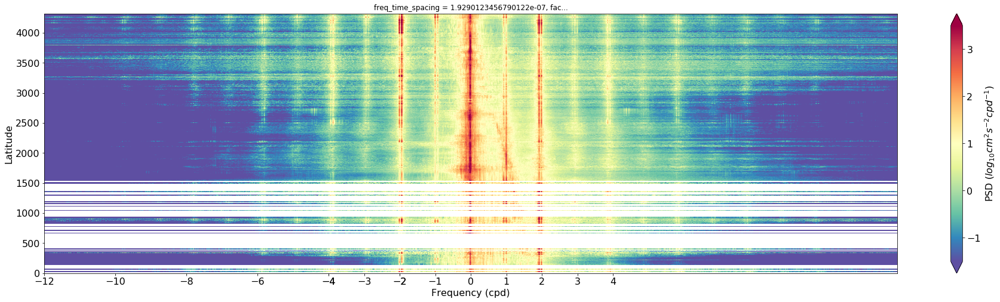

In [28]:
plt.figure(figsize=(32,8))
ax = plt.subplot(1,1,1)

E_200 = E_200.assign_coords(freq_cpd=E_200.freq_time * 86400.) 


#np.log10(ds0['E_200']).isel(freq_time=slice(0,720)).plot(ax=ax)


cax = np.log10(E_200/8.64).isel(freq_time=slice(0,720)).plot.pcolormesh(ax=ax, vmin=-2., vmax=4., x='freq_cpd', y='j', cmap = 'Spectral_r', add_colorbar = False)

cax = np.log10(E_200/8.64).isel(freq_time=slice(721,1440)).plot.pcolormesh(ax=ax, vmin=-2., vmax=4., x='freq_cpd', y='j', cmap = 'Spectral_r', add_colorbar = False)


# colorbar
cbar = plt.colorbar(cax, ax=ax, extend='both', orientation='vertical')
cbar.ax.tick_params(labelsize=16)
cbar.set_label('PSD ($log_{10} cm^2 s^{-2} cpd^{-1})$', fontsize=16)
            


# x,y ticks

ax.set_xticks(list(ax.get_xticks()) + [-4., -3., -2., -1., 1., 2., 3., 4.])
ax.set_xlim(-12., 12.)
#ax.set_ylim(-60., 60.)
#ax.set_yticks([-60., -40., -20., 0., 20., 40., 60.])
#ax.set_yticklabels(['60S','40S','20S','0N','20N','40N','60N'])

ax.set_ylabel('Latitude',fontsize=16)
ax.set_xlabel('Frequency (cpd)',fontsize=16)
ax.tick_params(labelsize=16)






In [29]:
#filenames_u = sorted(glob(E_dir+'E_500_face5_mean_openocean.nc'))
filenames_u = sorted(glob(E_dir+'E_200_face5_mean_coastalocean.nc'))

# Read SSU #
ds0 = xr.open_mfdataset(filenames_u)
print(ds0)

<xarray.Dataset>
Dimensions:                        (freq_time: 1440, j: 4320)
Coordinates:
  * j                              (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 ...
  * freq_time                      (freq_time) float64 0.0 1.929e-07 ...
    freq_time_spacing              float64 ...
    face                           int64 ...
    freq_cpd                       (freq_time) float64 dask.array<shape=(1440,), chunksize=(1440,)>
Data variables:
    __xarray_dataarray_variable__  (j, freq_time) float64 dask.array<shape=(4320, 1440), chunksize=(4320, 1440)>


In [30]:
E_500 = ds0.__xarray_dataarray_variable__
E_500 = E_500.assign_coords(freq_time=ds0.__xarray_dataarray_variable__.freq_time * 86400.) 
print(E_500)

<xarray.DataArray '__xarray_dataarray_variable__' (j: 4320, freq_time: 1440)>
dask.array<shape=(4320, 1440), dtype=float64, chunksize=(4320, 1440)>
Coordinates:
  * j                  (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 ...
  * freq_time          (freq_time) float64 0.0 0.01667 0.03333 0.05 0.06667 ...
    freq_time_spacing  float64 ...
    face               int64 ...
    freq_cpd           (freq_time) float64 dask.array<shape=(1440,), chunksize=(1440,)>


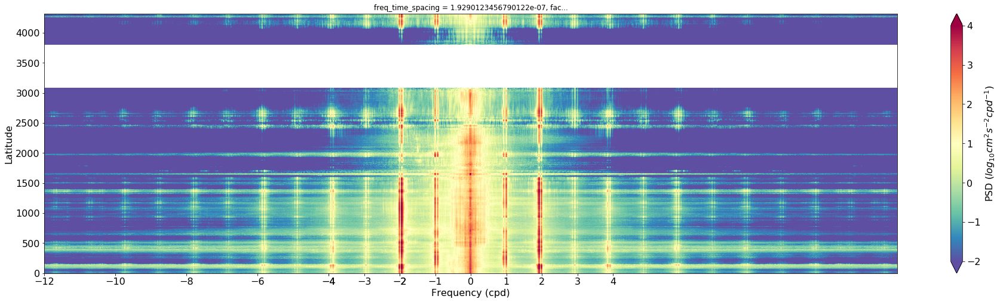

In [31]:
plt.figure(figsize=(32,8))
ax = plt.subplot(1,1,1)

cax = np.log10(E_500/8.64).isel(freq_time=slice(0,720)).plot.pcolormesh(ax=ax, vmin=-2., vmax=4., x='freq_cpd', y='j', cmap = 'Spectral_r', add_colorbar = False)
cax = np.log10(E_500/8.64).isel(freq_time=slice(721,1440)).plot.pcolormesh(ax=ax, vmin=-2., vmax=4., x='freq_cpd', y='j', cmap = 'Spectral_r', add_colorbar = False)


# colorbar
cbar = plt.colorbar(cax, ax=ax, extend='both', orientation='vertical')
cbar.ax.tick_params(labelsize=16)
cbar.set_label('PSD ($log_{10} cm^2 s^{-2} cpd^{-1})$', fontsize=16)
            
# x,y ticks
ax.set_xticks(list(ax.get_xticks()) + [-4., -3., -2., -1., 1., 2., 3., 4.])
ax.set_xlim(-12., 12.)
#ax.set_ylim(-60., 60.)
#ax.set_yticks([-60., -40., -20., 0., 20., 40., 60.])
#ax.set_yticklabels(['60S','40S','20S','0N','20N','40N','60N'])

ax.set_ylabel('Latitude',fontsize=16)
ax.set_xlabel('Frequency (cpd)',fontsize=16)
ax.tick_params(labelsize=16)




(-1, 6)

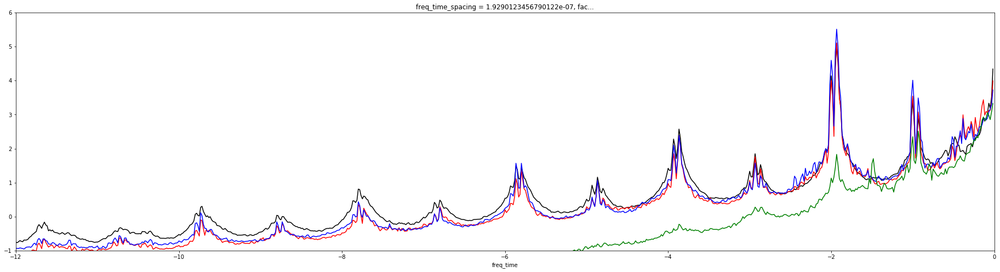

In [28]:
plt.figure(figsize=(32,8))
ax = plt.subplot(1,1,1)

np.log10(E_500).where(E_500.freq_time<0).isel(j=slice(0,100)).mean(dim=['j']).plot(ax=ax, color='black')
np.log10(E_500).where(E_500.freq_time>0).isel(j=slice(0,100)).mean(dim=['j']).plot(ax=ax, color='black')


np.log10(E_500).where(E_500.freq_time<0).isel(j=slice(500,600)).mean(dim=['j']).plot(ax=ax, color='red')
np.log10(E_500).where(E_500.freq_time>0).isel(j=slice(500,600)).mean(dim=['j']).plot(ax=ax, color='red')

np.log10(E_500).where(E_500.freq_time<0).isel(j=slice(1000,1100)).mean(dim=['j']).plot(ax=ax, color='blue')
np.log10(E_500).where(E_500.freq_time>0).isel(j=slice(1000,1100)).mean(dim=['j']).plot(ax=ax, color='blue')

np.log10(E_500).where(E_500.freq_time<0).isel(j=slice(2000,2100)).mean(dim=['j']).plot(ax=ax, color='green')
np.log10(E_500).where(E_500.freq_time>0).isel(j=slice(2000,2100)).mean(dim=['j']).plot(ax=ax, color='green')


ax.set_xlim([-12, 0])
ax.set_ylim([-1,6])


In [157]:
print(E_500)

<xarray.DataArray '__xarray_dataarray_variable__' (j: 4320, freq_time: 1440)>
dask.array<shape=(4320, 1440), dtype=float64, chunksize=(4320, 1440)>
Coordinates:
  * j                  (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 ...
  * freq_time          (freq_time) float64 0.0 0.01667 0.03333 0.05 0.06667 ...
    freq_time_spacing  float64 ...
    face               int64 ...
    freq_cpd           (freq_time) float64 dask.array<shape=(1440,), chunksize=(1440,)>


(-1, 5)

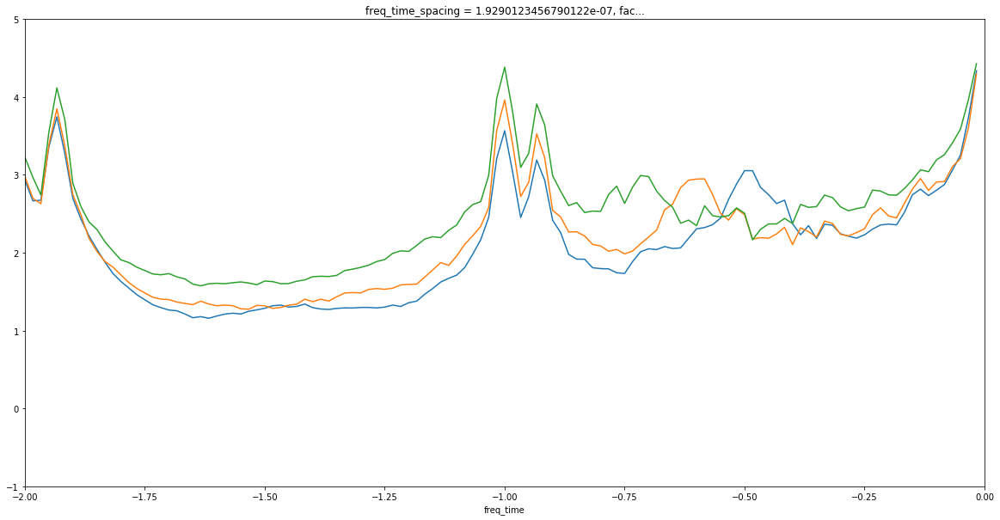

In [85]:
plt.figure(figsize=(20,10))
ax = plt.subplot(1,1,1)

np.log10(E_500).where(E_500.freq_time<0).isel(j=slice(0,10)).mean(dim=['j']).plot(ax=ax)
np.log10(E_500).where(E_500.freq_time<0).isel(j=slice(200,210)).mean(dim=['j']).plot(ax=ax)
np.log10(E_500).where(E_500.freq_time<0).isel(j=slice(400,410)).mean(dim=['j']).plot(ax=ax)




ax.set_xlim([-2, 0])
ax.set_ylim([-1,5])



In [ ]:
%time E1 = ds['E_uv'].mean(dim=('i','j')).load()

In [44]:
E = E.assign_coords(freq_cpd=E.freq_time * 86400.) 
print(E)

<xarray.DataArray (freq_time: 1440)>
array([1.934056e-26, 2.382013e+04, 6.896570e+03, ..., 2.635788e+03,
       6.864907e+03, 2.383545e+04])
Coordinates:
  * freq_time          (freq_time) float64 0.0 1.929e-07 3.858e-07 5.787e-07 ...
    freq_time_spacing  float64 1.929e-07
    face               int64 5
    freq_cpd           (freq_time) float64 0.0 0.01667 0.03333 0.05 0.06667 ...


In [48]:
E1 = E1.assign_coords(freq_cpd=E1.freq_time * 86400.) 
print(E1)

<xarray.DataArray 'E_uv' (freq_time: 1440)>
array([1.586817e-26, 1.933543e+04, 5.477999e+03, ..., 2.203710e+03,
       5.357299e+03, 1.933703e+04])
Coordinates:
  * freq_time          (freq_time) float64 0.0 1.929e-07 3.858e-07 5.787e-07 ...
    freq_time_spacing  float64 1.929e-07
    face               int64 5
    freq_cpd           (freq_time) float64 0.0 0.01667 0.03333 0.05 0.06667 ...


In [49]:
E2 = E1/8.64

In [45]:
E0 = E/8.64

No handles with labels found to put in legend.
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/site-packages/matplotlib/axes/_base.py:3129: UserWarning: Attempted to set non-positive xlimits for log-scale axis; invalid limits will be ignored.
  'Attempted to set non-positive xlimits for log-scale axis; '
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/site-packages/matplotlib/axes/_base.py:3449: UserWarning: Attempted to set non-positive ylimits for log-scale axis; invalid limits will be ignored.
  'Attempted to set non-positive ylimits for log-scale axis; '


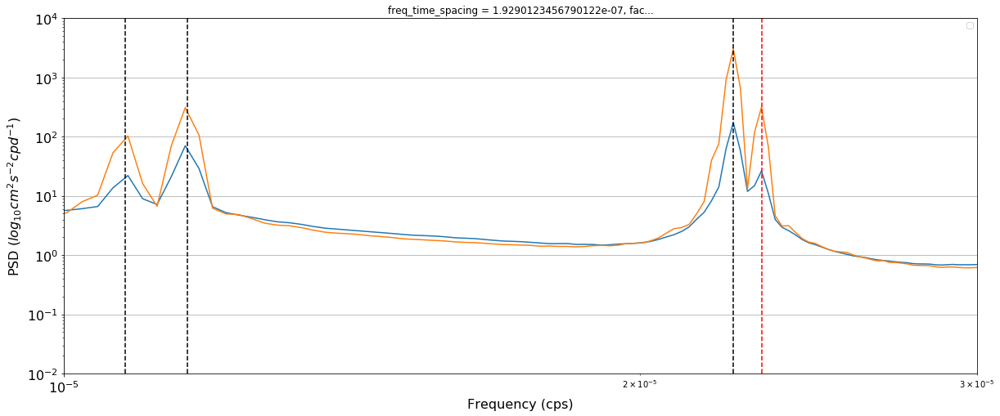

In [51]:
# SSU spectral plot


fig, ax = plt.subplots(figsize=(20,8))

E0.where(E0.freq_time>0).plot(ax=ax)
ax.legend(); ax.grid()
ax.set_xscale('log'); ax.set_yscale('log')
E2.where(E2.freq_time>0).plot(ax=ax)


#ax.set_ylabel(''); 
ax.set_ylim([1e-2,1e4])
ax.set_xlim([1e-5,3*1e-5])

# Semi-diurnal frequencies#
ax.plot([1/12.42/3600,1/12.42/3600],[1e-2,1e6],'k--') # M2
ax.plot([1/12/3600,1/12/3600],[1e-2,1e6],'r--')  # S2

# Diurnal frequencies#

ax.plot([1/23.93/3600,1/23.93/3600],[1e-2,1e6],'k--')      # K1
ax.plot([1/25.81/3600,1/25.81/3600],[1e-2,1e6],'k--') # O1


#ax.set_xlim(-5., 5.)
#ax.set_ylim(-60., 60.)
#ax.set_yticks([-60., -40., -20., 0., 20., 40., 60.])
#ax.set_yticklabels(['60S','40S','20S','0N','20N','40N','60N'])

ax.set_ylabel('PSD ($log_{10} cm^2 s^{-2} cpd^{-1})$',fontsize=16)
ax.set_xlabel('Frequency (cps)',fontsize=16)
ax.tick_params(labelsize=16)

# 5. Spatial variablity of some specific frequencies (e.g. M2,K1)

In [120]:
face = 10

file_E = E_dir+'E_uv_f%02d.nc'%face    
ds = xr.open_dataset(file_E, chunks={'i': 10, 'j': 432})
ds = ds.assign_coords(freq_cpd=ds.freq_time * 86400.)
print(ds)

<xarray.Dataset>
Dimensions:            (freq_time: 1440, i: 4320, j: 4320)
Coordinates:
  * i                  (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 ...
  * j                  (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 ...
  * freq_time          (freq_time) float64 0.0 1.929e-07 3.858e-07 5.787e-07 ...
    freq_time_spacing  float64 ...
    face               int64 ...
    XC                 (i, j) float32 dask.array<shape=(4320, 4320), chunksize=(10, 432)>
    YC                 (i, j) float32 dask.array<shape=(4320, 4320), chunksize=(10, 432)>
    rA                 (i, j) float32 dask.array<shape=(4320, 4320), chunksize=(10, 432)>
    Depth              (i, j) float32 dask.array<shape=(4320, 4320), chunksize=(10, 432)>
    freq_cpd           (freq_time) float64 0.0 0.01667 0.03333 0.05 0.06667 ...
Data variables:
    E_uv               (i, j, freq_time) float64 dask.array<shape=(4320, 4320, 1440), chunksize=(10, 432, 1440)>


In [121]:
print(ds.freq_cpd[120]) # 1 cpd

<xarray.DataArray 'freq_cpd' ()>
array(2.)
Coordinates:
    freq_time          float64 2.315e-05
    freq_time_spacing  float64 ...
    face               int64 ...
    freq_cpd           float64 2.0


In [122]:
E = ds['E_uv']
E = E.assign_coords(freq_cpd=E.freq_time * 86400.) 
print(E)

<xarray.DataArray 'E_uv' (i: 4320, j: 4320, freq_time: 1440)>
dask.array<shape=(4320, 4320, 1440), dtype=float64, chunksize=(10, 432, 1440)>
Coordinates:
  * i                  (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 ...
  * j                  (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 ...
  * freq_time          (freq_time) float64 0.0 1.929e-07 3.858e-07 5.787e-07 ...
    freq_time_spacing  float64 ...
    face               int64 ...
    XC                 (i, j) float32 dask.array<shape=(4320, 4320), chunksize=(10, 432)>
    YC                 (i, j) float32 dask.array<shape=(4320, 4320), chunksize=(10, 432)>
    rA                 (i, j) float32 dask.array<shape=(4320, 4320), chunksize=(10, 432)>
    Depth              (i, j) float32 dask.array<shape=(4320, 4320), chunksize=(10, 432)>
    freq_cpd           (freq_time) float64 0.0 0.01667 0.03333 0.05 0.06667 ...


In [123]:
df=E.freq_time[1]-E.freq_time[0]
print(df)

<xarray.DataArray 'freq_time' ()>
array(1.929012e-07)
Coordinates:
    freq_time_spacing  float64 1.929e-07
    face               int64 10


In [124]:
E_all = (E*df).sum(dim='freq_time').persist()

In [125]:
E_sdiurnal = (E.where((abs(E.freq_cpd)>1.9) & (abs(E.freq_cpd)<2.1) , other=0.)*df).sum(dim='freq_time').persist()

In [126]:
E_diurnal = (E.where((abs(E.freq_cpd)>0.9) & (abs(E.freq_cpd)<1.1) , other=0.)*df).sum(dim='freq_time').persist()

In [127]:
E_low = (E.where((abs(E.freq_cpd)>0) & (abs(E.freq_cpd)<0.5) , other=0.)*df).sum(dim='freq_time').persist()

In [130]:
f = 2.*2.*np.pi/86400. * np.sin(np.deg2rad(E.YC))
f_cpd = f*86400/2./np.pi
#f_cpd.plot()

In [131]:
E_f = (E.where(abs(E.freq_cpd+f_cpd)<.1, other=0.)*df).sum(dim='freq_time').persist()

### Total KE

distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


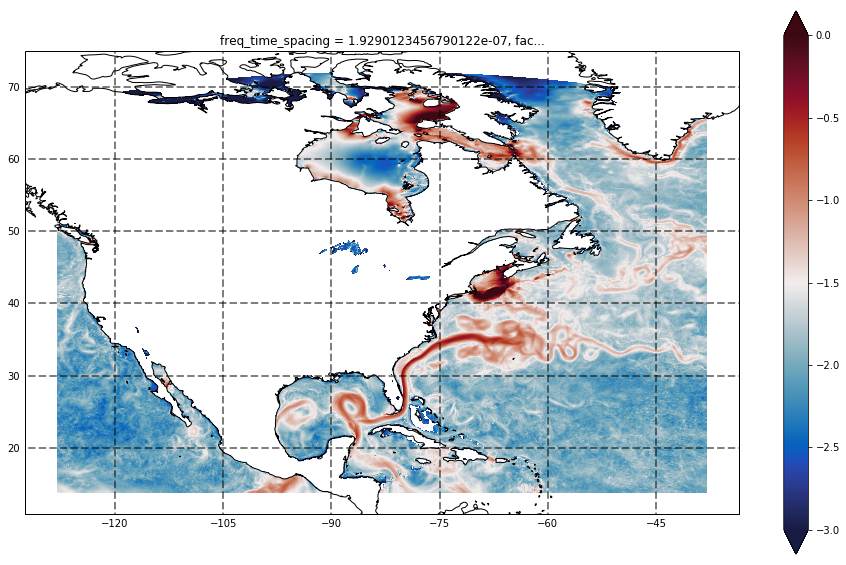

In [147]:
fig = plt.figure(figsize=(16,10))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
cax =  np.log10(E_all).plot.pcolormesh(ax=ax, x='XC', y='YC', transform=ccrs.PlateCarree(), vmin = -3, vmax = 0.,cmap = cm.balance) #, vmin = -2, vmax = 0.5

gl=ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='k', alpha=0.5, linestyle='--')
gl.xlabels_top = False
gl.ylabels_right = False
ax.coastlines(resolution='50m', color='k')

In [137]:
print(E_all)

<xarray.DataArray (i: 4320, j: 4320)>
dask.array<shape=(4320, 4320), dtype=float64, chunksize=(10, 432)>
Coordinates:
  * i                  (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 ...
  * j                  (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 ...
    freq_time_spacing  float64 1.929e-07
    face               int64 10
    XC                 (i, j) float32 dask.array<shape=(4320, 4320), chunksize=(10, 432)>
    YC                 (i, j) float32 dask.array<shape=(4320, 4320), chunksize=(10, 432)>
    rA                 (i, j) float32 dask.array<shape=(4320, 4320), chunksize=(10, 432)>
    Depth              (i, j) float32 dask.array<shape=(4320, 4320), chunksize=(10, 432)>


In [139]:
E_all_mean = E_all.mean(dim=['i','j']).compute()

In [141]:
print(E_all_mean)

<xarray.DataArray ()>
array(0.017334)
Coordinates:
    freq_time_spacing  float64 1.929e-07
    face               int64 10


### low-frequency(<2cpd)/total KE

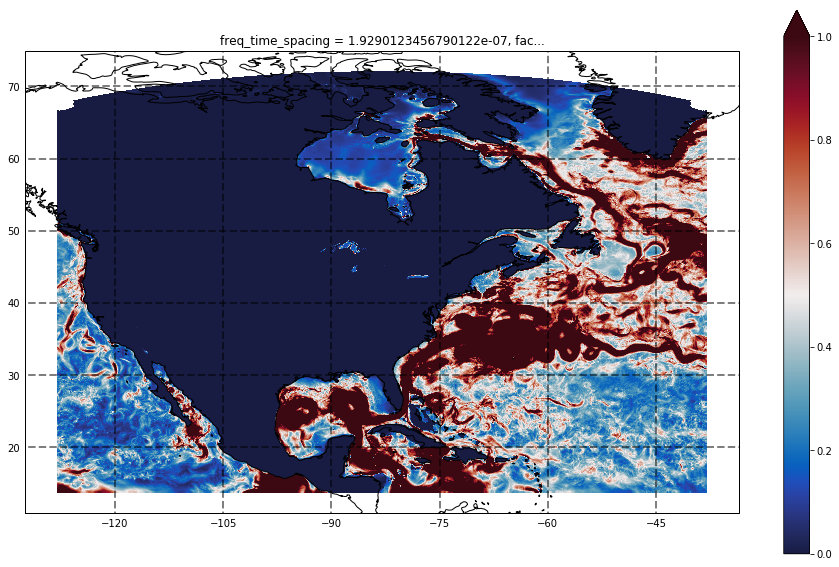

In [140]:
fig = plt.figure(figsize=(16,10))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
cax =  (E_low/E_all_mean).plot.pcolormesh(ax=ax, x='XC', y='YC', transform=ccrs.PlateCarree(), vmin = 0, vmax = 1,cmap = cm.balance)

gl=ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='k', alpha=0.5, linestyle='--')
gl.xlabels_top = False
gl.ylabels_right = False
ax.coastlines(resolution='50m', color='k')

### Semi-diurnal/total KE

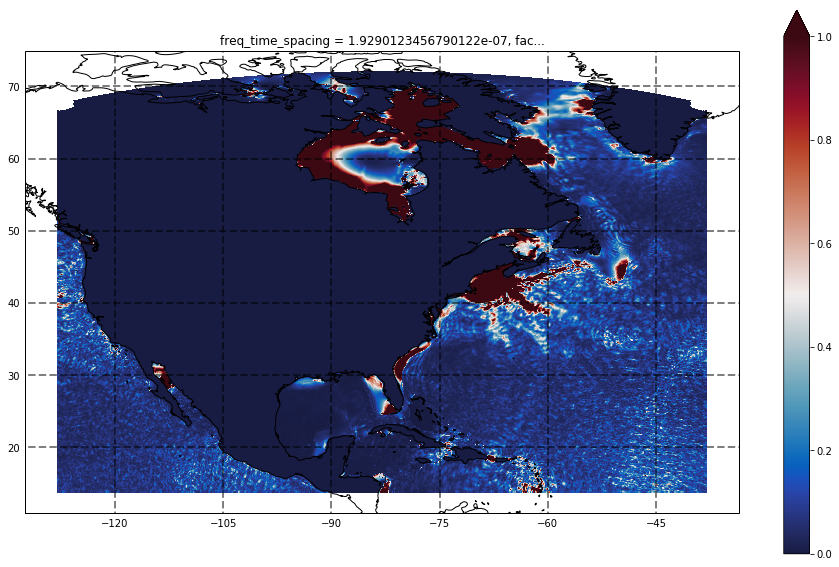

In [142]:
fig = plt.figure(figsize=(16,10))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
cax =  (E_sdiurnal/E_all_mean).plot.pcolormesh(ax=ax, x='XC', y='YC', transform=ccrs.PlateCarree(), vmin = 0, vmax = 1,cmap = cm.balance)

gl=ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='k', alpha=0.5, linestyle='--')
gl.xlabels_top = False
gl.ylabels_right = False
ax.coastlines(resolution='50m', color='k')

### Diurnal/total KE

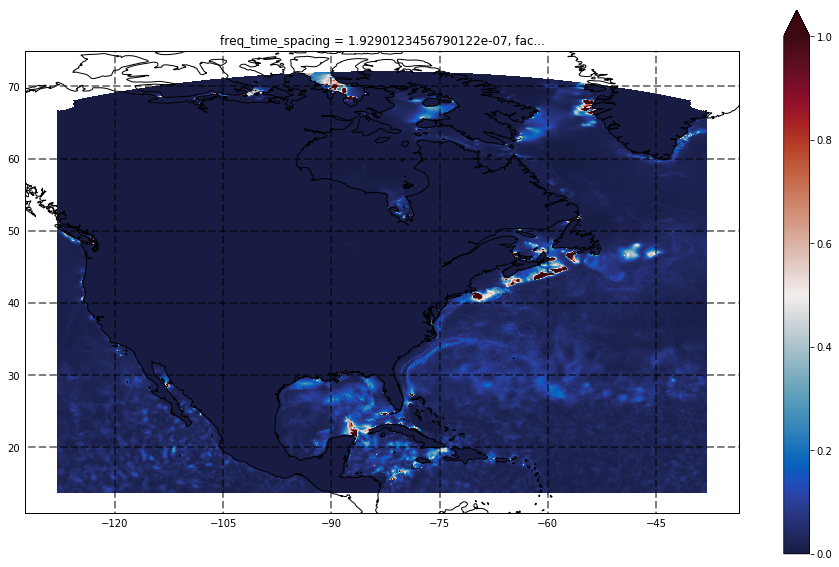

In [143]:
fig = plt.figure(figsize=(16,10))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
cax =  (E_diurnal/E_all_mean).plot.pcolormesh(ax=ax, x='XC', y='YC', transform=ccrs.PlateCarree(), vmin = 0, vmax = 1,cmap = cm.balance)

gl=ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='k', alpha=0.5, linestyle='--')
gl.xlabels_top = False
gl.ylabels_right = False
ax.coastlines(resolution='50m', color='k')

### Near-inertial/total KE

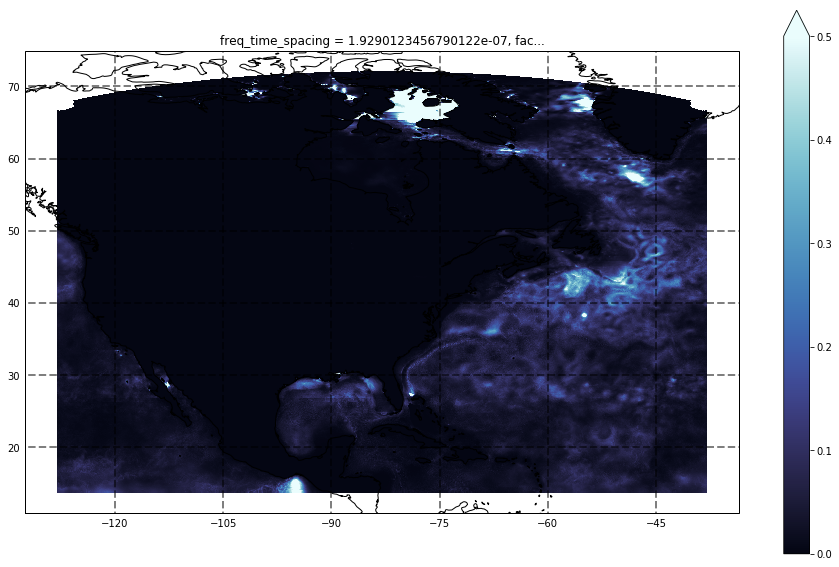

In [145]:
fig = plt.figure(figsize=(16,10))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
cax =  (E_f/E_all_mean).plot.pcolormesh(ax=ax, x='XC', y='YC', transform=ccrs.PlateCarree(), vmin = 0, vmax = 0.5,cmap = cm.balance)

gl=ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='k', alpha=0.5, linestyle='--')
gl.xlabels_top = False
gl.ylabels_right = False
ax.coastlines(resolution='50m', color='k')

In [ ]:
face = 5

file_E = E_dir+'E_uv_f%02d.nc'%face    
ds = xr.open_dataset(file_E, chunks={'i': 10, 'j': 432})
ds = ds.assign_coords(freq_cpd=ds.freq_time * 86400.)
print(ds)

In [41]:
print(ds.freq_cpd[120]) # 1 cpd

<xarray.DataArray 'freq_cpd' ()>
array(2.)
Coordinates:
    freq_time          float64 2.315e-05
    freq_time_spacing  float64 ...
    face               int64 ...
    freq_cpd           float64 2.0


In [42]:
eta = ds['E_uv'].isel(freq_time=120, i=slice(2500,4320), j=slice(0,2000)).persist() # 2 cpd

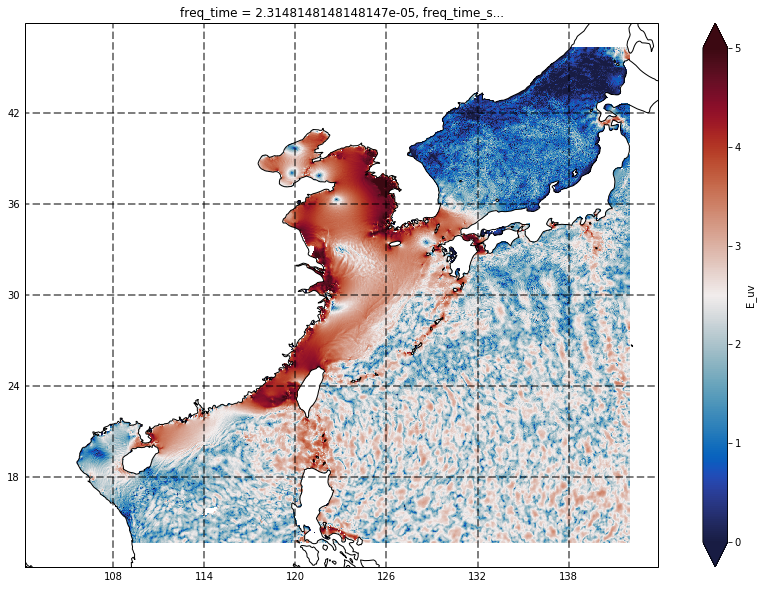

In [43]:
fig = plt.figure(figsize=(16,10))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
cax =  np.log10(eta).plot.pcolormesh(ax=ax, x='XC', y='YC', transform=ccrs.PlateCarree(), vmin = 0, vmax = 5, cmap = cm.balance)

gl=ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='k', alpha=0.5, linestyle='--')
gl.xlabels_top = False
gl.ylabels_right = False
ax.coastlines(resolution='50m', color='k')

In [44]:
eta = ds['E_uv'].isel(freq_time=60, i=slice(2500,4320), j=slice(0,2000)).persist() # 1 cpd

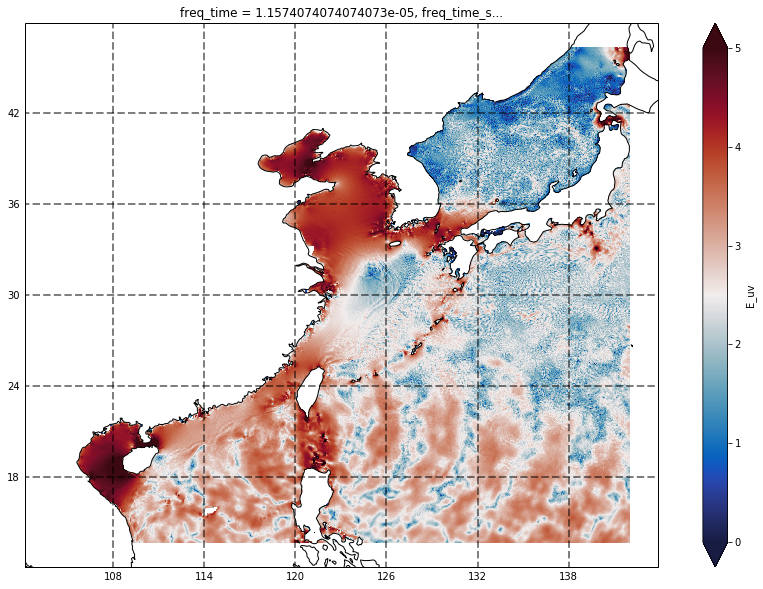

In [45]:
fig = plt.figure(figsize=(16,10))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
cax =  np.log10(eta).plot.pcolormesh(ax=ax, x='XC', y='YC', transform=ccrs.PlateCarree(), vmin = 0, vmax = 5, cmap = cm.balance)

gl=ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='k', alpha=0.5, linestyle='--')
gl.xlabels_top = False
gl.ylabels_right = False
ax.coastlines(resolution='50m', color='k')

# 6. Spatial-averaged spectra

In [6]:
face = 1

file_E = E_dir+'E_uv_f%02d.nc'%face    
ds = xr.open_dataset(file_E, chunks={'i': 10, 'j': 432})
ds = ds.assign_coords(freq_cpd=ds.freq_time * 86400.)
print(ds)
print('\n data size: %.1f GB' %(ds.nbytes / 1e9))

<xarray.Dataset>
Dimensions:            (freq_time: 1440, i: 4320, j: 4320)
Coordinates:
  * i                  (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 ...
  * j                  (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 ...
  * freq_time          (freq_time) float64 0.0 1.929e-07 3.858e-07 5.787e-07 ...
    freq_time_spacing  float64 ...
    face               int64 ...
    XC                 (i, j) float32 dask.array<shape=(4320, 4320), chunksize=(10, 432)>
    YC                 (i, j) float32 dask.array<shape=(4320, 4320), chunksize=(10, 432)>
    rA                 (i, j) float32 dask.array<shape=(4320, 4320), chunksize=(10, 432)>
    Depth              (i, j) float32 dask.array<shape=(4320, 4320), chunksize=(10, 432)>
    freq_cpd           (freq_time) float64 0.0 0.01667 0.03333 0.05 0.06667 ...
Data variables:
    E_uv               (i, j, freq_time) float64 dask.array<shape=(4320, 4320, 1440), chunksize=(10, 432, 1440)>

 data size: 215.3 GB


In [7]:
%time E = ds['E_uv'].mean(dim=('i','j')).load()

CPU times: user 1min 21s, sys: 3.46 s, total: 1min 25s
Wall time: 9min 35s


In [8]:
E = E.assign_coords(freq_cpd=E.freq_time * 86400.) 
print(E)

<xarray.DataArray 'E_uv' (freq_time: 1440)>
array([1.064459e-08, 2.279952e+04, 1.702352e+04, ..., 9.479996e+03,
       1.745471e+04, 2.369208e+04])
Coordinates:
  * freq_time          (freq_time) float64 0.0 1.929e-07 3.858e-07 5.787e-07 ...
    freq_time_spacing  float64 1.929e-07
    face               int64 1
    freq_cpd           (freq_time) float64 0.0 0.01667 0.03333 0.05 0.06667 ...


### cm^2 s^-2/cpd

In [9]:
E0 = E/8.64

No handles with labels found to put in legend.


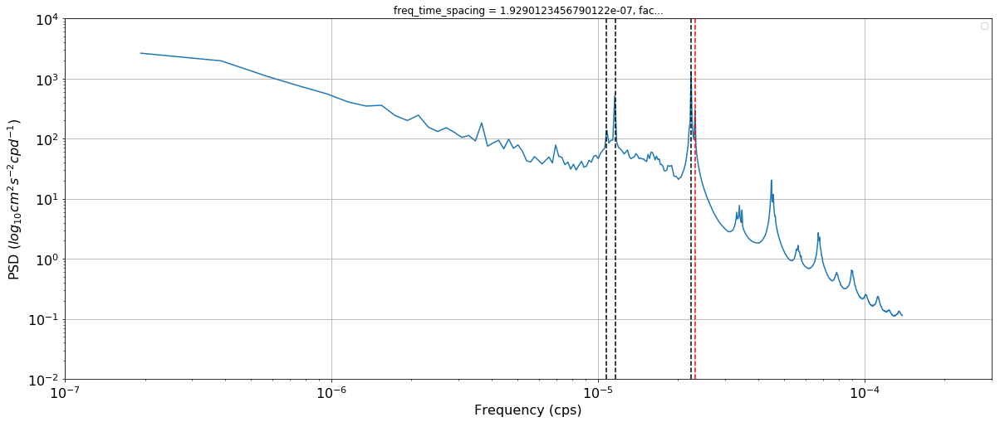

In [14]:
# SSU spectral plot


fig, ax = plt.subplots(figsize=(20,8))

E0.where(E0.freq_time>0).plot(ax=ax)
ax.legend(); ax.grid()
ax.set_xscale('log'); ax.set_yscale('log')

#ax.set_ylabel(''); 
ax.set_ylim([1e-2,1e4])
ax.set_xlim([1e-7,3*1e-4])

# Semi-diurnal frequencies#
ax.plot([1/12.42/3600,1/12.42/3600],[1e-2,1e6],'k--') # M2
ax.plot([1/12/3600,1/12/3600],[1e-2,1e6],'r--')  # S2

# Diurnal frequencies#

ax.plot([1/23.93/3600,1/23.93/3600],[1e-2,1e6],'k--')      # K1
ax.plot([1/25.81/3600,1/25.81/3600],[1e-2,1e6],'k--') # O1


#ax.set_xlim(-5., 5.)
#ax.set_ylim(-60., 60.)
#ax.set_yticks([-60., -40., -20., 0., 20., 40., 60.])
#ax.set_yticklabels(['60S','40S','20S','0N','20N','40N','60N'])

ax.set_ylabel('PSD ($log_{10} cm^2 s^{-2} cpd^{-1})$',fontsize=16)
ax.set_xlabel('Frequency (cps)',fontsize=16)
ax.tick_params(labelsize=16)

No handles with labels found to put in legend.


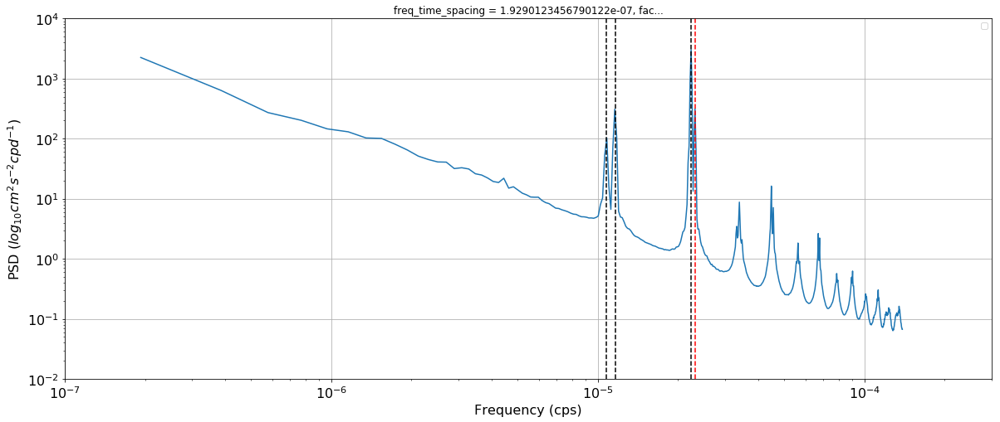

In [66]:
# SSU spectral plot


fig, ax = plt.subplots(figsize=(20,8))

E0.where(E0.freq_time>0).plot(ax=ax)
ax.legend(); ax.grid()
ax.set_xscale('log'); ax.set_yscale('log')

#ax.set_ylabel(''); 
ax.set_ylim([1e-2,1e4])
ax.set_xlim([1e-7,3*1e-4])

# Semi-diurnal frequencies#
ax.plot([1/12.42/3600,1/12.42/3600],[1e-2,1e6],'k--') # M2
ax.plot([1/12/3600,1/12/3600],[1e-2,1e6],'r--')  # S2

# Diurnal frequencies#

ax.plot([1/23.93/3600,1/23.93/3600],[1e-2,1e6],'k--')      # K1
ax.plot([1/25.81/3600,1/25.81/3600],[1e-2,1e6],'k--') # O1


#ax.set_xlim(-5., 5.)
#ax.set_ylim(-60., 60.)
#ax.set_yticks([-60., -40., -20., 0., 20., 40., 60.])
#ax.set_yticklabels(['60S','40S','20S','0N','20N','40N','60N'])

ax.set_ylabel('PSD ($log_{10} cm^2 s^{-2} cpd^{-1})$',fontsize=16)
ax.set_xlabel('Frequency (cps)',fontsize=16)
ax.tick_params(labelsize=16)

No handles with labels found to put in legend.


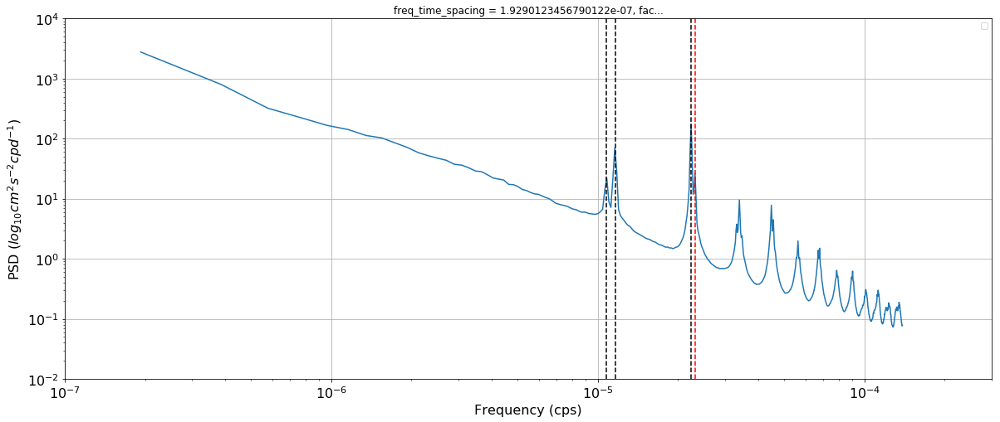

In [46]:
# SSU spectral plot


fig, ax = plt.subplots(figsize=(20,8))

E0.where(E0.freq_time>0).plot(ax=ax)
ax.legend(); ax.grid()
ax.set_xscale('log'); ax.set_yscale('log')

#ax.set_ylabel(''); 
ax.set_ylim([1e-2,1e4])
ax.set_xlim([1e-7,3*1e-4])

# Semi-diurnal frequencies#
ax.plot([1/12.42/3600,1/12.42/3600],[1e-2,1e6],'k--') # M2
ax.plot([1/12/3600,1/12/3600],[1e-2,1e6],'r--')  # S2

# Diurnal frequencies#

ax.plot([1/23.93/3600,1/23.93/3600],[1e-2,1e6],'k--')      # K1
ax.plot([1/25.81/3600,1/25.81/3600],[1e-2,1e6],'k--') # O1


#ax.set_xlim(-5., 5.)
#ax.set_ylim(-60., 60.)
#ax.set_yticks([-60., -40., -20., 0., 20., 40., 60.])
#ax.set_yticklabels(['60S','40S','20S','0N','20N','40N','60N'])

ax.set_ylabel('PSD ($log_{10} cm^2 s^{-2} cpd^{-1})$',fontsize=16)
ax.set_xlabel('Frequency (cps)',fontsize=16)
ax.tick_params(labelsize=16)

### m^2 s^-2/cpd

In [67]:
E1 = E/86400

No handles with labels found to put in legend.


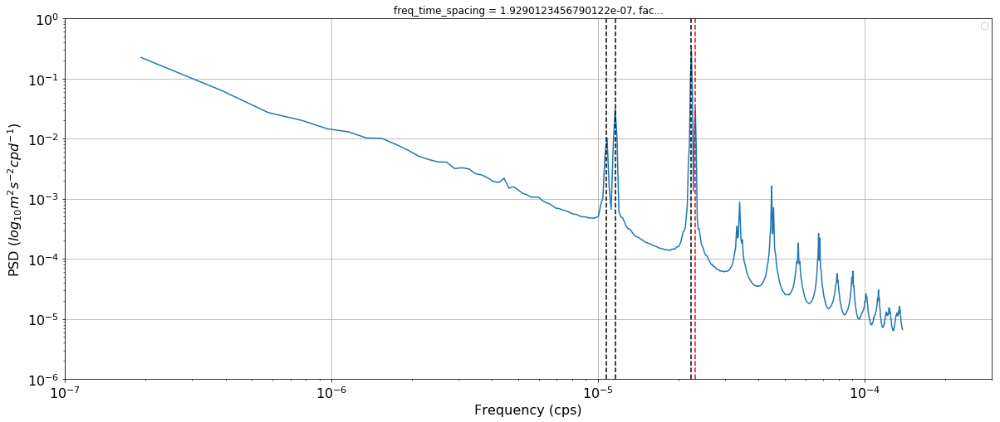

In [72]:
# SSU spectral plot


fig, ax = plt.subplots(figsize=(20,8))

E1.where(E1.freq_time>0).plot(ax=ax)
ax.legend(); ax.grid()
ax.set_xscale('log'); ax.set_yscale('log')

#ax.set_ylabel(''); 
ax.set_ylim([1e-6,1e0])
ax.set_xlim([1e-7,3*1e-4])

# Semi-diurnal frequencies#
ax.plot([1/12.42/3600,1/12.42/3600],[1e-6,1e6],'k--') # M2
ax.plot([1/12/3600,1/12/3600],[1e-6,1e6],'r--')  # S2

# Diurnal frequencies#

ax.plot([1/23.93/3600,1/23.93/3600],[1e-6,1e6],'k--')      # K1
ax.plot([1/25.81/3600,1/25.81/3600],[1e-6,1e6],'k--') # O1


#ax.set_xlim(-5., 5.)
#ax.set_ylim(-60., 60.)
#ax.set_yticks([-60., -40., -20., 0., 20., 40., 60.])
#ax.set_yticklabels(['60S','40S','20S','0N','20N','40N','60N'])

ax.set_ylabel('PSD ($log_{10} m^2 s^{-2} cpd^{-1})$',fontsize=16)
ax.set_xlabel('Frequency (cps)',fontsize=16)
ax.tick_params(labelsize=16)

### m^2 s^-2/cph

In [74]:
E2 = E/0.36

No handles with labels found to put in legend.


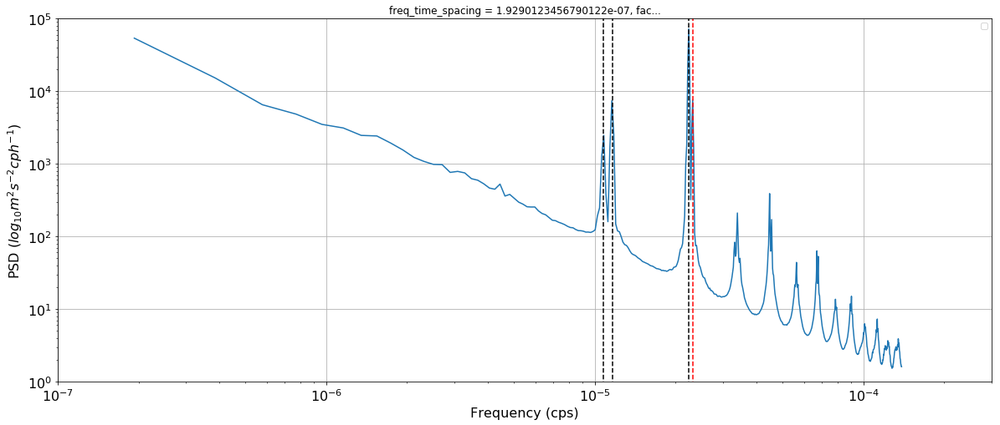

In [84]:
# SSU spectral plot


fig, ax = plt.subplots(figsize=(20,8))

E2.where(E2.freq_time>0).plot(ax=ax)
ax.legend(); ax.grid()
ax.set_xscale('log'); ax.set_yscale('log')


#ax.set_ylabel(''); 
ax.set_ylim([1e0,1e5])
ax.set_xlim([1e-7,3*1e-4])

# Semi-diurnal frequencies#
ax.plot([1/12.42/3600,1/12.42/3600],[1e-6,1e6],'k--') # M2
ax.plot([1/12/3600,1/12/3600],[1e-6,1e6],'r--')  # S2

# Diurnal frequencies#

ax.plot([1/23.93/3600,1/23.93/3600],[1e-6,1e6],'k--')      # K1
ax.plot([1/25.81/3600,1/25.81/3600],[1e-6,1e6],'k--') # O1


#ax.set_xlim(-5., 5.)
#ax.set_ylim(-60., 60.)
#ax.set_yticks([-60., -40., -20., 0., 20., 40., 60.])
#ax.set_yticklabels(['60S','40S','20S','0N','20N','40N','60N'])

ax.set_ylabel('PSD ($log_{10} m^2 s^{-2} cph^{-1})$',fontsize=16)
ax.set_xlabel('Frequency (cps)',fontsize=16)
ax.tick_params(labelsize=16)

---

In [7]:
cluster.scheduler.close()

<Future finished result=None>